In [42]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import KMeans
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA

In [43]:
#Upload the excel file
data_original=pd.read_excel("World_development_mesurement.xlsx")
data_original.head()

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,NaN,26998.0,"$54,790,058,957",0.035,$60,...,67.0,0.0,1,0.342,0.619,0.039,31719449,0.599,"$102,000,000","$193,000,000"
1,0.050,NaN,9542.0,Angola,NaN,NaN,7499.0,"$9,129,594,819",0.034,$22,...,44.0,0.0,1,0.476,0.499,0.025,13924930,0.324,"$34,000,000","$146,000,000"
2,0.043,NaN,1617.0,Benin,NaN,NaN,1983.0,"$2,359,122,303",0.043,$15,...,53.0,0.0,1,0.454,0.517,0.029,6949366,0.383,"$77,000,000","$50,000,000"
3,0.027,NaN,4276.0,Botswana,NaN,NaN,1836.0,"$5,788,311,645",0.047,$152,...,49.0,0.1,1,0.383,0.587,0.029,1755375,0.532,"$227,000,000","$209,000,000"
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,NaN,"$2,610,959,139",0.051,$12,...,49.0,0.0,1,0.468,0.505,0.028,11607944,0.178,"$23,000,000","$30,000,000"


In [44]:
data=data_original.copy()
data.head(10)

,Birth Rate,Business Tax Rate,CO2 Emissions,Country,Days to Start Business,Ease of Business,Energy Usage,GDP,Health Exp % GDP,Health Exp/Capita,...,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban,Tourism Inbound,Tourism Outbound
0,0.020,NaN,87931.0,Algeria,NaN,NaN,26998.0,"$54,790,058,957",0.035,$60,...,67.0,0.0,1,0.342,0.619,0.039,31719449,0.599,"$102,000,000","$193,000,000"
1,0.050,NaN,9542.0,Angola,NaN,NaN,7499.0,"$9,129,594,819",0.034,$22,...,44.0,0.0,1,0.476,0.499,0.025,13924930,0.324,"$34,000,000","$146,000,000"
2,0.043,NaN,1617.0,Benin,NaN,NaN,1983.0,"$2,359,122,303",0.043,$15,...,53.0,0.0,1,0.454,0.517,0.029,6949366,0.383,"$77,000,000","$50,000,000"
3,0.027,NaN,4276.0,Botswana,NaN,NaN,1836.0,"$5,788,311,645",0.047,$152,...,49.0,0.1,1,0.383,0.587,0.029,1755375,0.532,"$227,000,000","$209,000,000"
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,NaN,"$2,610,959,139",0.051,$12,...,49.0,0.0,1,0.468,0.505,0.028,11607944,0.178,"$23,000,000","$30,000,000"
5,0.042,NaN,301.0,Burundi,NaN,NaN,NaN,"$870,486,066",0.063,$7,...,47.0,0.0,1,0.490,0.481,0.029,6674286,0.082,"$1,400,000","$14,000,000"
6,0.041,NaN,3432.0,Cameroon,NaN,NaN,6310.0,"$9,287,367,569",0.044,$26,...,51.0,0.0,1,0.453,0.513,0.034,15927713,0.455,"$132,000,000","$241,000,000"
7,0.039,NaN,268.0,Central African Republic,NaN,NaN,NaN,"$914,500,332",0.043,$11,...,42.0,0.0,1,0.423,0.537,0.040,3638316,0.376,"$5,000,000","$33,000,000"
8,0.051,NaN,176.0,Chad,NaN,NaN,NaN,"$1,385,058,212",0.063,$10,...,46.0,0.0,1,0.490,0.482,0.028,8301151,0.216,"$14,000,000","$56,000,000"
9,0.039,NaN,84.0,Comoros,NaN,NaN,NaN,"$201,899,884",0.035,$13,...,56.0,NaN,1,0.415,0.554,0.031,528312,0.281,"$15,000,000",NaN


In [45]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 25 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Birth Rate              2585 non-null   float64
 1   Business Tax Rate       1423 non-null   object 
 2   CO2 Emissions           2125 non-null   float64
 3   Country                 2704 non-null   object 
 4   Days to Start Business  1718 non-null   float64
 5   Ease of Business        185 non-null    float64
 6   Energy Usage            1785 non-null   float64
 7   GDP                     2494 non-null   object 
 8   Health Exp % GDP        2395 non-null   float64
 9   Health Exp/Capita       2395 non-null   object 
 10  Hours to do Tax         1416 non-null   float64
 11  Infant Mortality Rate   2444 non-null   float64
 12  Internet Usage          2531 non-null   float64
 13  Lending Interest        1880 non-null   float64
 14  Life Expectancy Female  2568 non-null   

In [46]:
data.describe()

,Birth Rate,CO2 Emissions,Days to Start Business,Ease of Business,Energy Usage,Health Exp % GDP,Hours to do Tax,Infant Mortality Rate,Internet Usage,Lending Interest,Life Expectancy Female,Life Expectancy Male,Mobile Phone Usage,Number of Records,Population 0-14,Population 15-64,Population 65+,Population Total,Population Urban
count,2585.000000,2.125000e+03,1718.000000,185.000000,1.785000e+03,2395.000000,1416.000000,2444.000000,2531.000000,1880.000000,2568.000000,2568.000000,2537.000000,2704.0,2484.000000,2484.000000,2484.000000,2.704000e+03,2678.000000
mean,0.022715,1.423071e+05,39.999418,94.875676,7.723684e+04,0.064170,302.068503,0.032813,0.239747,0.148103,71.159268,66.461838,0.578124,1.0,0.303051,0.623481,0.073465,3.145729e+07,0.562953
std,0.011338,6.159288e+05,57.318588,54.791906,2.599239e+05,0.026325,273.299686,0.029968,0.260132,0.171829,10.708262,9.390217,0.474647,0.0,0.106577,0.069660,0.049541,1.242894e+08,0.245897
min,0.007000,7.000000e+00,1.000000,1.000000,8.000000e+00,0.008000,12.000000,0.002000,0.000000,0.005000,39.000000,37.000000,0.000000,1.0,0.118000,0.474000,0.003000,1.887600e+04,0.082000
25%,0.013000,1.360000e+03,13.000000,48.000000,3.737000e+03,0.046000,156.000000,0.009000,0.000000,0.080000,64.000000,61.000000,0.100000,1.0,0.204750,0.559000,0.033000,8.783360e+05,0.356000
50%,0.020000,8.529000e+03,26.000000,94.000000,1.433800e+04,0.061000,239.000000,0.020000,0.100000,0.120000,75.000000,69.000000,0.500000,1.0,0.299500,0.642500,0.052000,5.800324e+06,0.560000
75%,0.031000,5.910800e+04,45.000000,142.000000,4.185200e+04,0.079000,344.750000,0.053000,0.400000,0.173000,79.000000,73.250000,0.900000,1.0,0.402000,0.676000,0.112000,2.014089e+07,0.765000
max,0.053000,8.286892e+06,694.000000,189.000000,2.727728e+06,0.225000,2600.000000,0.141000,1.000000,4.965000,87.000000,88.000000,2.900000,1.0,0.500000,0.858000,0.244000,1.350695e+09,1.000000


In [47]:
data.isnull().sum()

Birth Rate                 119
Business Tax Rate         1281
CO2 Emissions              579
Country                      0
Days to Start Business     986
Ease of Business          2519
Energy Usage               919
GDP                        210
Health Exp % GDP           309
Health Exp/Capita          309
Hours to do Tax           1288
Infant Mortality Rate      260
Internet Usage             173
Lending Interest           824
Life Expectancy Female     136
Life Expectancy Male       136
Mobile Phone Usage         167
Number of Records            0
Population 0-14            220
Population 15-64           220
Population 65+             220
Population Total             0
Population Urban            26
Tourism Inbound            368
Tourism Outbound           471
dtype: int64

In [48]:
#cleaning the dataset renaming column names as they have spaces between words
data.rename(columns={"Birth Rate":"Birth_Rate"},inplace=True)
data.rename(columns={'Birth Rate':'Birth_Rate'},inplace=True)
data.rename(columns={'Business Tax Rate':'Business_Tax_Rate'},inplace=True)
data.rename(columns={'CO2 Emissions':'CO2_Emissions'},inplace=True)
data.rename(columns={'Days to Start Business':'Days_to_Start_Business'},inplace=True)
data.rename(columns={'Ease of Business':'Ease_of_Business'},inplace=True)
data.rename(columns={'Energy Usage':'Energy_Usage'},inplace=True)
data.rename(columns={'Health Exp % GDP':'Health_Exp_percentage_GDP'},inplace=True)
data.rename(columns={'Health Exp/Capita':'Health_Exp_per_Capita'},inplace=True)
data.rename(columns={'Hours to do Tax':'Hours_to_do_Tax'},inplace=True)
data.rename(columns={'Infant Mortality Rate':'Infant_Mortality_Rate'},inplace=True)
data.rename(columns={'Internet Usage':'Internet_Usage'},inplace=True)
data.rename(columns={'Lending Interest':'Lending_Interest'},inplace=True)
data.rename(columns={'Life Expectancy Female':'Life_Expectancy_Female'},inplace=True)
data.rename(columns={'Life Expectancy Male':'Life_Expectancy_Male'},inplace=True)
data.rename(columns={'Mobile Phone Usage':'Mobile_Phone_Usage'},inplace=True)
data.rename(columns={'Number of Records':'Number_of_Records'},inplace=True)
data.rename(columns={'Population 0-14':'Population_0_to_14'},inplace=True)
data.rename(columns={'Population 15-64':'Population_15_to_64'},inplace=True)
data.rename(columns={'Population 65+':'Population_65_plus'},inplace=True)
data.rename(columns={'Population Total':'Population_Total'},inplace=True)
data.rename(columns={'Population Urban':'Population_Urban'},inplace=True)
data.rename(columns={'Tourism Inbound':'Tourism_Inbound'},inplace=True)
data.rename(columns={'Tourism Outbound':'Tourism_Outbound'},inplace=True)

In [49]:
data.head()

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Country,Days_to_Start_Business,Ease_of_Business,Energy_Usage,GDP,Health_Exp_percentage_GDP,Health_Exp_per_Capita,...,Life_Expectancy_Male,Mobile_Phone_Usage,Number_of_Records,Population_0_to_14,Population_15_to_64,Population_65_plus,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound
0,0.020,NaN,87931.0,Algeria,NaN,NaN,26998.0,"$54,790,058,957",0.035,$60,...,67.0,0.0,1,0.342,0.619,0.039,31719449,0.599,"$102,000,000","$193,000,000"
1,0.050,NaN,9542.0,Angola,NaN,NaN,7499.0,"$9,129,594,819",0.034,$22,...,44.0,0.0,1,0.476,0.499,0.025,13924930,0.324,"$34,000,000","$146,000,000"
2,0.043,NaN,1617.0,Benin,NaN,NaN,1983.0,"$2,359,122,303",0.043,$15,...,53.0,0.0,1,0.454,0.517,0.029,6949366,0.383,"$77,000,000","$50,000,000"
3,0.027,NaN,4276.0,Botswana,NaN,NaN,1836.0,"$5,788,311,645",0.047,$152,...,49.0,0.1,1,0.383,0.587,0.029,1755375,0.532,"$227,000,000","$209,000,000"
4,0.046,NaN,1041.0,Burkina Faso,NaN,NaN,NaN,"$2,610,959,139",0.051,$12,...,49.0,0.0,1,0.468,0.505,0.028,11607944,0.178,"$23,000,000","$30,000,000"


In [50]:
data["Country"].nunique()

208

In [51]:
#Create LabelEncoder object
le =LabelEncoder()
#Converting categorical to numerical
#Fit and transform the "Country" column in DataFrame
data["Country_encoded"]=le.fit_transform(data["Country"])
data["Country_encoded"]=data["Country_encoded"].astype(float)

In [52]:
data.drop(["Country"],axis=1,inplace=True)

In [53]:
data.shape

(2704, 25)

In [54]:
data.head()

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Ease_of_Business,Energy_Usage,GDP,Health_Exp_percentage_GDP,Health_Exp_per_Capita,Hours_to_do_Tax,...,Mobile_Phone_Usage,Number_of_Records,Population_0_to_14,Population_15_to_64,Population_65_plus,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound,Country_encoded
0,0.020,NaN,87931.0,NaN,NaN,26998.0,"$54,790,058,957",0.035,$60,NaN,...,0.0,1,0.342,0.619,0.039,31719449,0.599,"$102,000,000","$193,000,000",2.0
1,0.050,NaN,9542.0,NaN,NaN,7499.0,"$9,129,594,819",0.034,$22,NaN,...,0.0,1,0.476,0.499,0.025,13924930,0.324,"$34,000,000","$146,000,000",5.0
2,0.043,NaN,1617.0,NaN,NaN,1983.0,"$2,359,122,303",0.043,$15,NaN,...,0.0,1,0.454,0.517,0.029,6949366,0.383,"$77,000,000","$50,000,000",20.0
3,0.027,NaN,4276.0,NaN,NaN,1836.0,"$5,788,311,645",0.047,$152,NaN,...,0.1,1,0.383,0.587,0.029,1755375,0.532,"$227,000,000","$209,000,000",25.0
4,0.046,NaN,1041.0,NaN,NaN,NaN,"$2,610,959,139",0.051,$12,NaN,...,0.0,1,0.468,0.505,0.028,11607944,0.178,"$23,000,000","$30,000,000",29.0


In [55]:
#Removing special symbols and changing datatypes from categorial to numerical
data['GDP']=data['GDP'].astype(str).str.replace('$','',regex=True).str.replace(',','')
data['GDP']=pd.to_numeric(data['GDP'],errors='coerce')
data['Health_Exp_per_Capita']=data['Health_Exp_per_Capita'].astype(str).str.replace('$','',regex=True)
data['Health_Exp_per_Capita']=pd.to_numeric(data['Health_Exp_per_Capita'],errors='coerce')
data['Tourism_Inbound']=data['Tourism_Inbound'].astype(str).str.replace('$','',regex=True).str.replace(',', '')
data['Tourism_Inbound'] = pd.to_numeric(data['Tourism_Inbound'],errors='coerce')
data['Tourism_Outbound']=data['Tourism_Outbound'].astype(str).str.replace('$','',regex=True).str.replace(',', '')
data['Tourism_Outbound'] = pd.to_numeric(data['Tourism_Outbound'],errors='coerce')
# Remove % and from columns converting to numeric
data['Business_Tax_Rate']=data['Business_Tax_Rate'].astype(str).str.replace('%','',regex=True)
data['Business_Tax_Rate'] = pd.to_numeric(data['Business_Tax_Rate'],errors='coerce')

In [56]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2704 entries, 0 to 2703
Data columns (total 25 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Birth_Rate                 2585 non-null   float64
 1   Business_Tax_Rate          1423 non-null   float64
 2   CO2_Emissions              2125 non-null   float64
 3   Days_to_Start_Business     1718 non-null   float64
 4   Ease_of_Business           185 non-null    float64
 5   Energy_Usage               1785 non-null   float64
 6   GDP                        2494 non-null   float64
 7   Health_Exp_percentage_GDP  2395 non-null   float64
 8   Health_Exp_per_Capita      1932 non-null   float64
 9   Hours_to_do_Tax            1416 non-null   float64
 10  Infant_Mortality_Rate      2444 non-null   float64
 11  Internet_Usage             2531 non-null   float64
 12  Lending_Interest           1880 non-null   float64
 13  Life_Expectancy_Female     2568 non-null   float

In [57]:
# check distribution for Numerical columns
data.describe()

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Ease_of_Business,Energy_Usage,GDP,Health_Exp_percentage_GDP,Health_Exp_per_Capita,Hours_to_do_Tax,...,Mobile_Phone_Usage,Number_of_Records,Population_0_to_14,Population_15_to_64,Population_65_plus,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound,Country_encoded
count,2585.000000,1423.000000,2.125000e+03,1718.000000,185.000000,1.785000e+03,2.494000e+03,2395.000000,1932.000000,1416.000000,...,2537.000000,2704.0,2484.000000,2484.000000,2484.000000,2.704000e+03,2678.000000,2.336000e+03,2.233000e+03,2704.00000
mean,0.022715,48.966901,1.423071e+05,39.999418,94.875676,7.723684e+04,2.638540e+11,0.064170,214.627847,302.068503,...,0.578124,1.0,0.303051,0.623481,0.073465,3.145729e+07,0.562953,4.939320e+09,4.729435e+09,103.50000
std,0.011338,40.954116,6.159288e+05,57.318588,54.791906,2.599239e+05,1.129910e+12,0.026325,233.750350,273.299686,...,0.474647,0.0,0.106577,0.069660,0.049541,1.242894e+08,0.245897,1.385098e+10,1.326774e+10,60.05484
min,0.007000,8.200000,7.000000e+00,1.000000,1.000000,8.000000e+00,6.310127e+07,0.008000,2.000000,12.000000,...,0.000000,1.0,0.118000,0.474000,0.003000,1.887600e+04,0.082000,7.000000e+05,2.000000e+05,0.00000
25%,0.013000,32.400000,1.360000e+03,13.000000,48.000000,3.737000e+03,3.539042e+09,0.046000,37.000000,156.000000,...,0.100000,1.0,0.204750,0.559000,0.033000,8.783360e+05,0.356000,1.250000e+08,1.100000e+08,51.75000
50%,0.020000,41.000000,8.529000e+03,26.000000,94.000000,1.433800e+04,1.507975e+10,0.061000,115.500000,239.000000,...,0.500000,1.0,0.299500,0.642500,0.052000,5.800324e+06,0.560000,6.885000e+08,4.560000e+08,103.50000
75%,0.031000,51.550000,5.910800e+04,45.000000,142.000000,4.185200e+04,1.102047e+11,0.079000,318.250000,344.750000,...,0.900000,1.0,0.402000,0.676000,0.112000,2.014089e+07,0.765000,3.601500e+09,2.842000e+09,155.25000
max,0.053000,339.100000,8.286892e+06,694.000000,189.000000,2.727728e+06,1.624460e+13,0.225000,998.000000,2600.000000,...,2.900000,1.0,0.500000,0.858000,0.244000,1.350695e+09,1.000000,2.000920e+11,1.265730e+11,207.00000


In [58]:
# Drop "Number of Records" column
data = data.drop(['Number_of_Records'],axis=1)

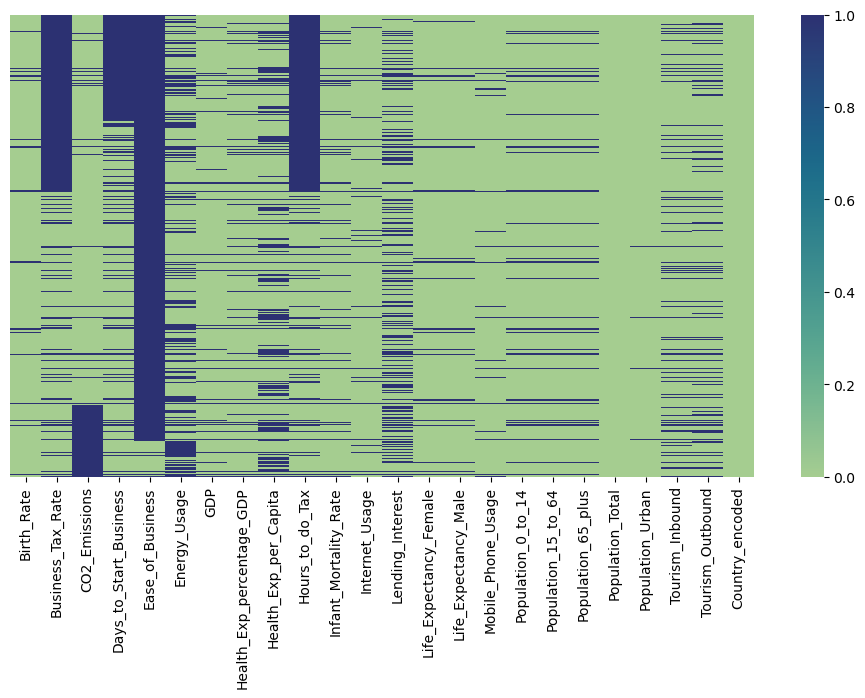

In [59]:
#visualizing the null values for each attribute
plt.figure(figsize=(12,6))
sns.heatmap(data.isnull(),cmap='crest',yticklabels=False,cbar=True)
plt.show()

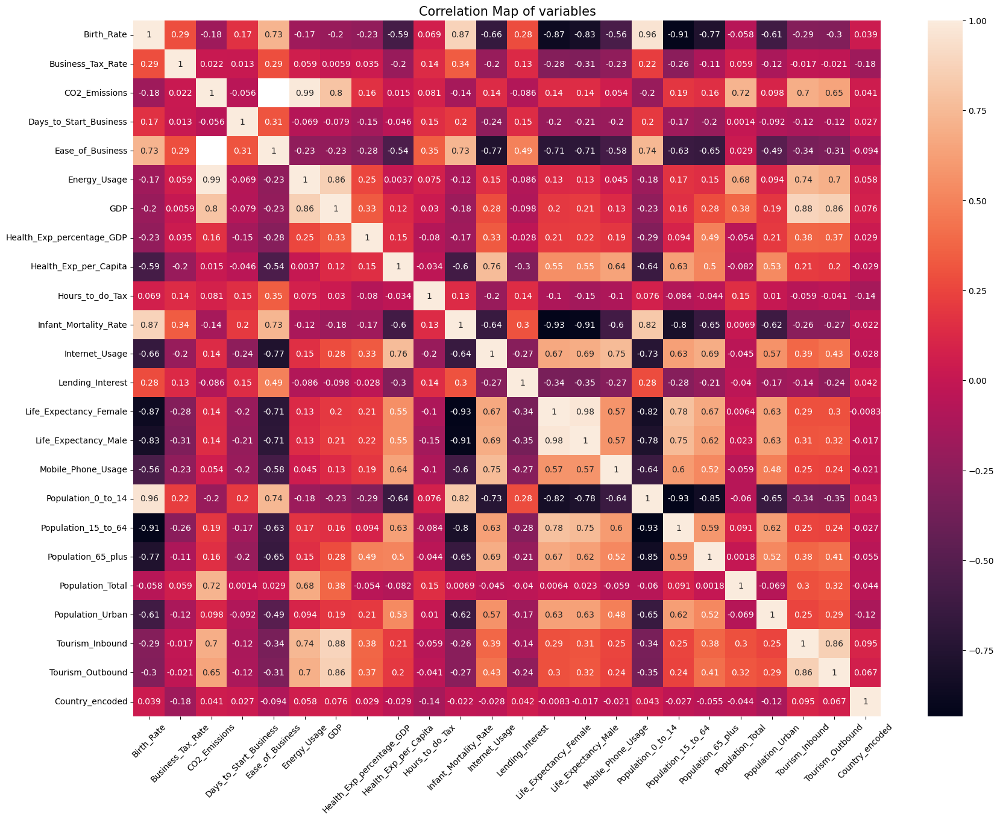

In [60]:
## visualise relation between variables
plt.figure(figsize=(20,15))
sns.heatmap(data.corr(),annot=True)
plt.xticks(rotation=45)
plt.title("Correlation Map of variables", fontsize=15)
plt.show()

In [61]:
data.isnull().sum()

Birth_Rate                    119
Business_Tax_Rate            1281
CO2_Emissions                 579
Days_to_Start_Business        986
Ease_of_Business             2519
Energy_Usage                  919
GDP                           210
Health_Exp_percentage_GDP     309
Health_Exp_per_Capita         772
Hours_to_do_Tax              1288
Infant_Mortality_Rate         260
Internet_Usage                173
Lending_Interest              824
Life_Expectancy_Female        136
Life_Expectancy_Male          136
Mobile_Phone_Usage            167
Population_0_to_14            220
Population_15_to_64           220
Population_65_plus            220
Population_Total                0
Population_Urban               26
Tourism_Inbound               368
Tourism_Outbound              471
Country_encoded                 0
dtype: int64

In [62]:
# Remove rows having null values
data.dropna(subset=['Population_Urban'],inplace=True)

In [63]:
 data.isnull().sum()

Birth_Rate                    119
Business_Tax_Rate            1259
CO2_Emissions                 553
Days_to_Start_Business        964
Ease_of_Business             2494
Energy_Usage                  905
GDP                           197
Health_Exp_percentage_GDP     283
Health_Exp_per_Capita         746
Hours_to_do_Tax              1266
Infant_Mortality_Rate         234
Internet_Usage                147
Lending_Interest              807
Life_Expectancy_Female        136
Life_Expectancy_Male          136
Mobile_Phone_Usage            141
Population_0_to_14            195
Population_15_to_64           195
Population_65_plus            195
Population_Total                0
Population_Urban                0
Tourism_Inbound               342
Tourism_Outbound              445
Country_encoded                 0
dtype: int64

In [64]:
data.shape

(2678, 24)

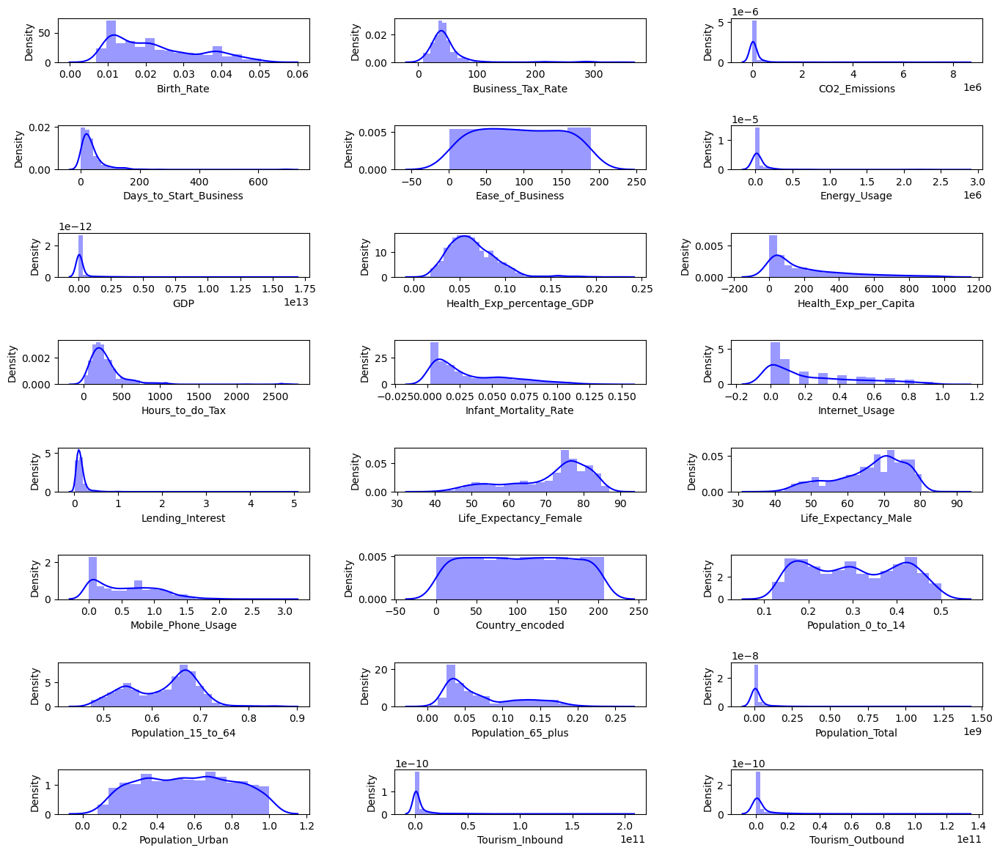

In [65]:
# Distribution plots for all columns
fig, axes=plt.subplots(8,3,figsize=(14,12),sharex=False,sharey=False)
sns.distplot(data.Birth_Rate,ax=axes[0,0],color='b')
sns.distplot(data.Business_Tax_Rate,ax=axes[0,1],color='b')
sns.distplot(data.CO2_Emissions,ax=axes[0,2],color='b')
sns.distplot(data.Days_to_Start_Business,ax=axes[1,0],color='b')
sns.distplot(data.Ease_of_Business,ax=axes[1,1],color='b')
sns.distplot(data.Energy_Usage,ax=axes[1,2],color='b')
sns.distplot(data.GDP,ax=axes[2,0],color='b')
sns.distplot(data.Health_Exp_percentage_GDP,ax=axes[2,1],color='b')
sns.distplot(data.Health_Exp_per_Capita,ax=axes[2,2],color='b')
sns.distplot(data.Hours_to_do_Tax,ax=axes[3,0],color='b')
sns.distplot(data.Infant_Mortality_Rate,ax=axes[3,1],color='b')
sns.distplot(data.Internet_Usage,ax=axes[3,2],color='b')
sns.distplot(data.Lending_Interest,ax=axes[4,0],color='b')
sns.distplot(data.Life_Expectancy_Female,ax=axes[4,1],color='b')
sns.distplot(data.Life_Expectancy_Male,ax=axes[4,2],color='b')
sns.distplot(data.Mobile_Phone_Usage,ax=axes[5,0],color='b')
sns.distplot(data.Country_encoded,ax=axes[5,1],color='b')
sns.distplot(data.Population_0_to_14,ax=axes[5,2],color='b')
sns.distplot(data.Population_15_to_64,ax=axes[6,0],color='b')
sns.distplot(data.Population_65_plus,ax=axes[6,1],color='b')
sns.distplot(data.Population_Total,ax=axes[6,2],color='b')
sns.distplot(data.Population_Urban,ax=axes[7,0],color='b')
sns.distplot(data.Tourism_Inbound,ax=axes[7,1],color='b')
sns.distplot(data.Tourism_Outbound,ax=axes[7,2],color='b')
plt.tight_layout(pad=2.0)

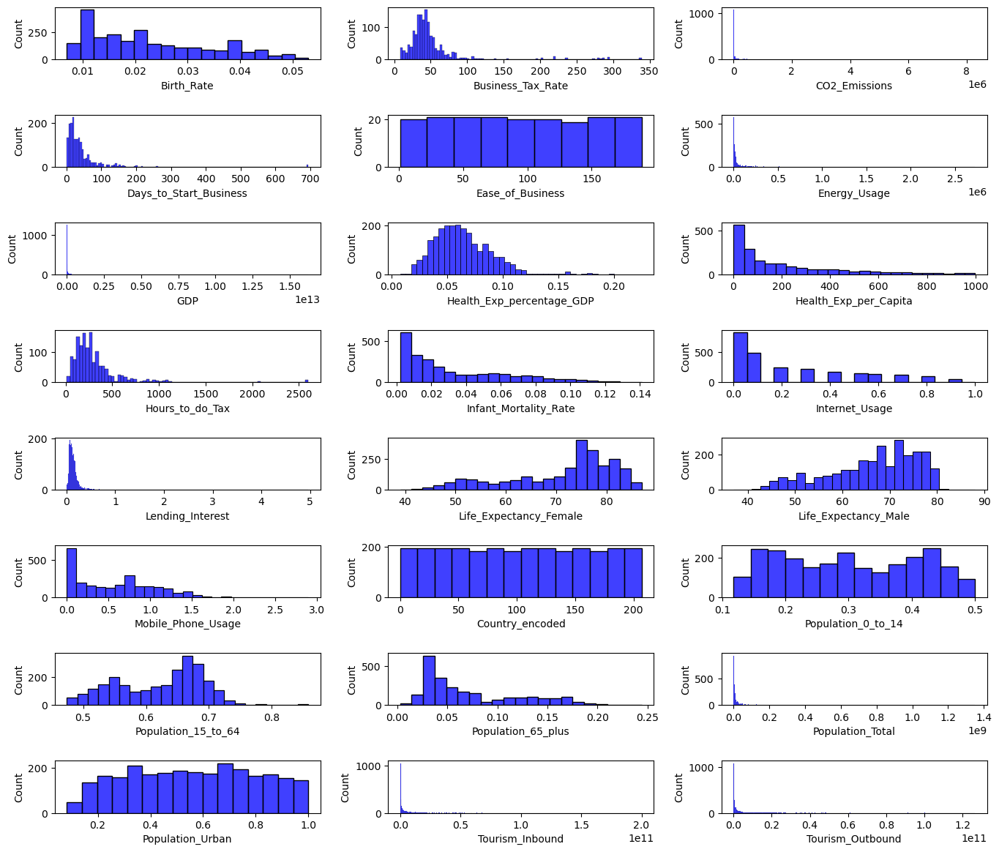

In [66]:
# Distribution plots for all columns
fig, axes=plt.subplots(8,3,figsize=(14,12),sharex=False,sharey=False)
sns.histplot(data.Birth_Rate,ax=axes[0,0],color='b')
sns.histplot(data.Business_Tax_Rate,ax=axes[0,1],color='b')
sns.histplot(data.CO2_Emissions,ax=axes[0,2],color='b')
sns.histplot(data.Days_to_Start_Business,ax=axes[1,0],color='b')
sns.histplot(data.Ease_of_Business,ax=axes[1,1],color='b')
sns.histplot(data.Energy_Usage,ax=axes[1,2],color='b')
sns.histplot(data.GDP,ax=axes[2,0],color='b')
sns.histplot(data.Health_Exp_percentage_GDP,ax=axes[2,1],color='b')
sns.histplot(data.Health_Exp_per_Capita,ax=axes[2,2],color='b')
sns.histplot(data.Hours_to_do_Tax,ax=axes[3,0],color='b')
sns.histplot(data.Infant_Mortality_Rate,ax=axes[3,1],color='b')
sns.histplot(data.Internet_Usage,ax=axes[3,2],color='b')
sns.histplot(data.Lending_Interest,ax=axes[4,0],color='b')
sns.histplot(data.Life_Expectancy_Female,ax=axes[4,1],color='b')
sns.histplot(data.Life_Expectancy_Male,ax=axes[4,2],color='b')
sns.histplot(data.Mobile_Phone_Usage,ax=axes[5,0],color='b')
sns.histplot(data.Country_encoded,ax=axes[5,1],color='b')
sns.histplot(data.Population_0_to_14,ax=axes[5,2],color='b')
sns.histplot(data.Population_15_to_64,ax=axes[6,0],color='b')
sns.histplot(data.Population_65_plus,ax=axes[6,1],color='b')
sns.histplot(data.Population_Total,ax=axes[6,2],color='b')
sns.histplot(data.Population_Urban,ax=axes[7,0],color='b')
sns.histplot(data.Tourism_Inbound,ax=axes[7,1],color='b')
sns.histplot(data.Tourism_Outbound,ax=axes[7,2],color='b')
plt.tight_layout(pad=2.0)

In [67]:
#treating the null values with mean and median
# Replace missing values by mean
data['Business_Tax_Rate'] = data['Business_Tax_Rate'].fillna(data['Business_Tax_Rate'].mean())
data['Ease_of_Business'] = data['Ease_of_Business'].fillna(data['Ease_of_Business'].mean())
data['Health_Exp_percentage_GDP'] = data['Health_Exp_percentage_GDP'].fillna(data['Health_Exp_percentage_GDP'].mean())
data['Hours_to_do_Tax'] = data['Hours_to_do_Tax'].fillna(data['Hours_to_do_Tax'].mean())
data['Population_0_to_14'] = data['Population_0_to_14'].fillna(data['Population_0_to_14'].mean())
# Replace missing values by median
data['Birth_Rate'] = data['Birth_Rate'].fillna(data['Birth_Rate'].median())
data['CO2_Emissions'] = data['CO2_Emissions'].fillna(data['CO2_Emissions'].median())
data['Days_to_Start_Business'] = data['Days_to_Start_Business'].fillna(data['Days_to_Start_Business'].median())
data['Energy_Usage'] = data['Energy_Usage'].fillna(data['Energy_Usage'].median())
data['Health_Exp_per_Capita']=data['Health_Exp_per_Capita'].fillna(data['Health_Exp_per_Capita'].mean())
data['GDP'] = data['GDP'].fillna(data['GDP'].median())
data['Infant_Mortality_Rate'] = data['Infant_Mortality_Rate'].fillna(data['Infant_Mortality_Rate'].median())
data['Internet_Usage'] = data['Internet_Usage'].fillna(data['Internet_Usage'].median())
data['Lending_Interest'] = data['Lending_Interest'].fillna(data['Lending_Interest'].median())
data['Life_Expectancy_Female'] = data['Life_Expectancy_Female'].fillna(data['Life_Expectancy_Female'].median())
data['Life_Expectancy_Male'] = data['Life_Expectancy_Male'].fillna(data['Life_Expectancy_Male'].median())
data['Mobile_Phone_Usage'] = data['Mobile_Phone_Usage'].fillna(data['Mobile_Phone_Usage'].median())
data['Tourism_Inbound'] = data['Tourism_Inbound'].fillna(data['Tourism_Inbound'].median())
data['Tourism_Outbound'] = data['Tourism_Outbound'].fillna(data['Tourism_Outbound'].median())
data['Population_15_to_64'] = data['Population_15_to_64'].fillna(data['Population_15_to_64'].median())
data['Population_65_plus'] = data['Population_65_plus'].fillna(data['Population_65_plus'].median())

In [68]:
 data.isnull().sum()

Birth_Rate                   0
Business_Tax_Rate            0
CO2_Emissions                0
Days_to_Start_Business       0
Ease_of_Business             0
Energy_Usage                 0
GDP                          0
Health_Exp_percentage_GDP    0
Health_Exp_per_Capita        0
Hours_to_do_Tax              0
Infant_Mortality_Rate        0
Internet_Usage               0
Lending_Interest             0
Life_Expectancy_Female       0
Life_Expectancy_Male         0
Mobile_Phone_Usage           0
Population_0_to_14           0
Population_15_to_64          0
Population_65_plus           0
Population_Total             0
Population_Urban             0
Tourism_Inbound              0
Tourism_Outbound             0
Country_encoded              0
dtype: int64

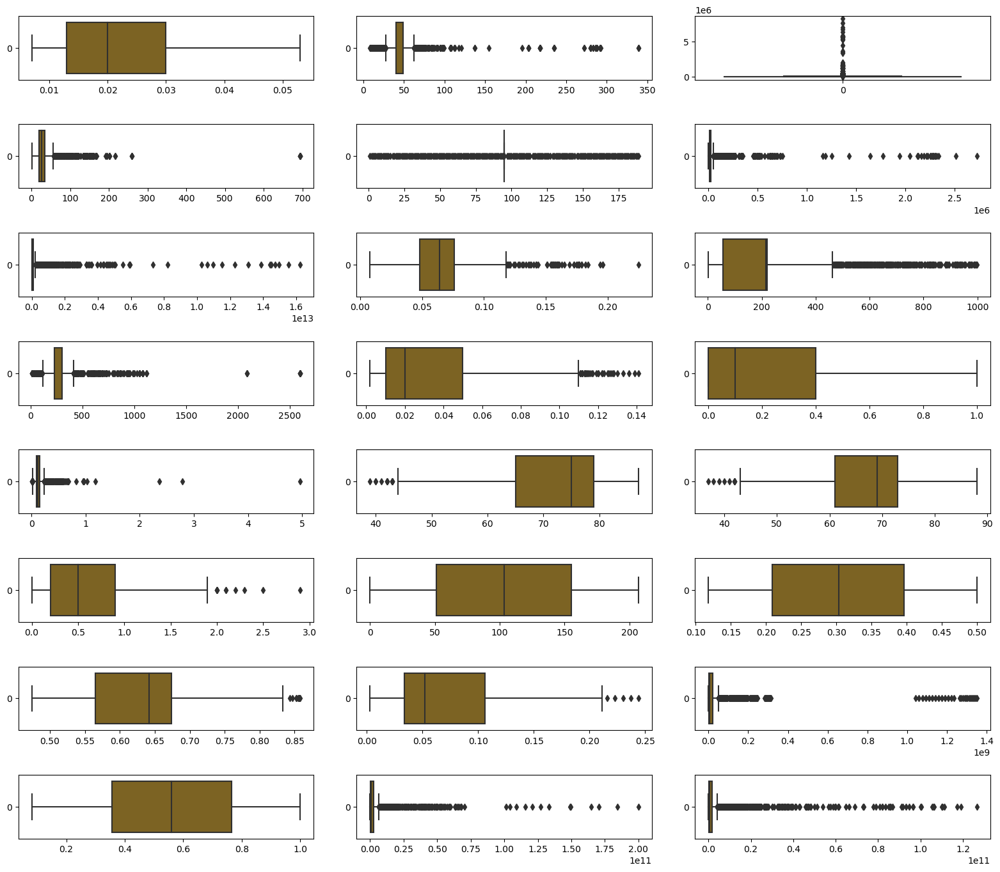

In [69]:
# Distribution plots for all columns
fig, axes=plt.subplots(8,3,figsize=(16,14),sharex=False,sharey=False)
sns.boxplot(data['Birth_Rate'],ax=axes[0,0],color='#8B6914',orient='h')
sns.boxplot(data['Business_Tax_Rate'],ax=axes[0,1],color='#8B6914',orient='h')
sns.boxplot(data['CO2_Emissions'],ax=axes[0,2],color='#8B6914')
sns.boxplot(data['Days_to_Start_Business'],ax=axes[1,0],color='#8B6914',orient='h')
sns.boxplot(data['Ease_of_Business'],ax=axes[1,1],color='#8B6914',orient='h')
sns.boxplot(data['Energy_Usage'],ax=axes[1,2],color='#8B6914',orient='h')
sns.boxplot(data['GDP'],ax=axes[2,0],color='#8B6914',orient='h')
sns.boxplot(data['Health_Exp_percentage_GDP'],ax=axes[2,1],color='#8B6914',orient='h')
sns.boxplot(data['Health_Exp_per_Capita'],ax=axes[2,2],color='#8B6914',orient='h')
sns.boxplot(data['Hours_to_do_Tax'],ax=axes[3,0],color='#8B6914',orient='h')
sns.boxplot(data['Infant_Mortality_Rate'],ax=axes[3,1],color='#8B6914',orient='h')
sns.boxplot(data['Internet_Usage'],ax=axes[3,2],color='#8B6914',orient='h')
sns.boxplot(data['Lending_Interest'],ax=axes[4,0],color='#8B6914',orient='h')
sns.boxplot(data['Life_Expectancy_Female'],ax=axes[4,1],color='#8B6914',orient='h')
sns.boxplot(data['Life_Expectancy_Male'],ax=axes[4,2],color='#8B6914',orient='h')
sns.boxplot(data['Mobile_Phone_Usage'],ax=axes[5,0],color='#8B6914',orient='h')
sns.boxplot(data['Country_encoded'],ax=axes[5,1],color='#8B6914',orient='h')
sns.boxplot(data['Population_0_to_14'],ax=axes[5,2],color='#8B6914',orient='h')
sns.boxplot(data['Population_15_to_64'],ax=axes[6,0],color='#8B6914',orient='h')
sns.boxplot(data['Population_65_plus'],ax=axes[6,1],color='#8B6914',orient='h')
sns.boxplot(data['Population_Total'],ax=axes[6,2],color='#8B6914',orient='h')
sns.boxplot(data['Population_Urban'],ax=axes[7,0],color='#8B6914',orient='h')
sns.boxplot(data['Tourism_Inbound'],ax=axes[7,1],color='#8B6914',orient='h')
sns.boxplot(data['Tourism_Outbound'],ax=axes[7,2],color='#8B6914',orient='h')
plt.tight_layout(pad=2.0)

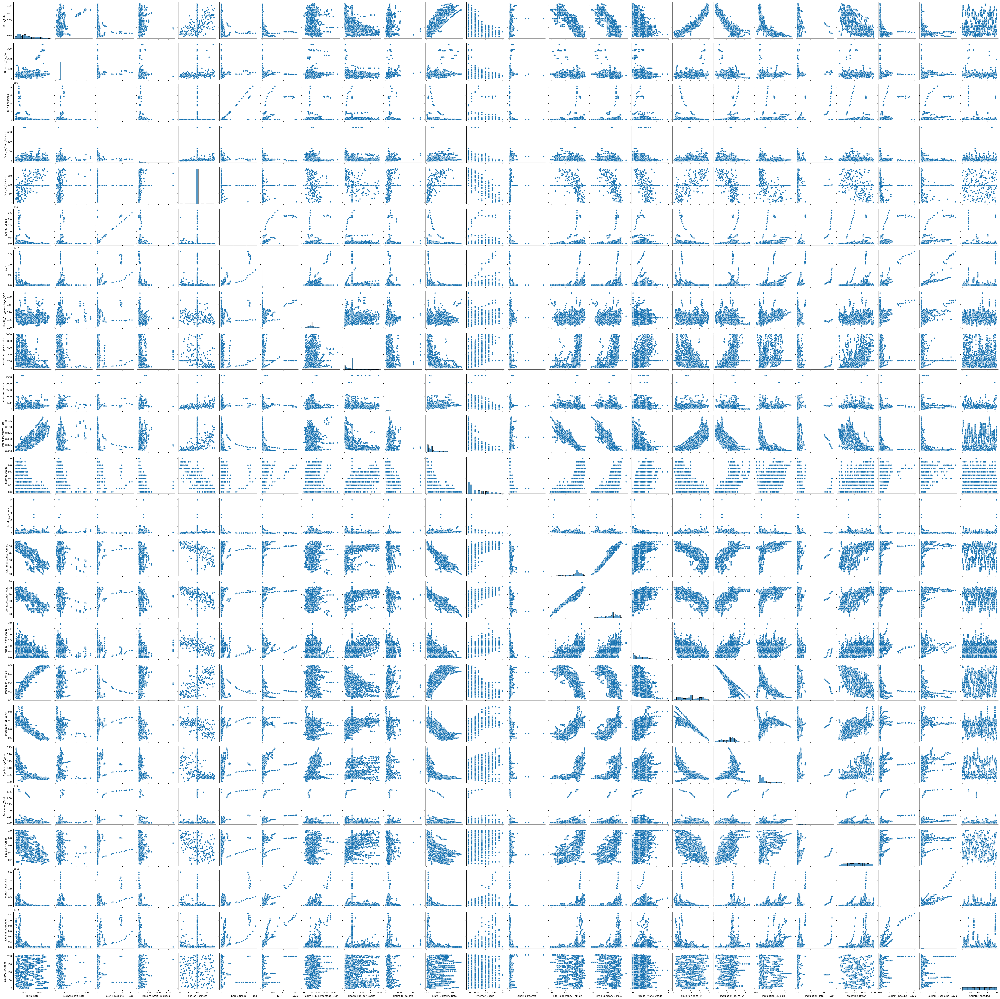

In [70]:
sns.pairplot(data)

In [71]:
#Auto EDA by sweeviz method

In [72]:
!pip install sweetviz

In [73]:
import sweetviz as sv
analyze_report = sv.analyze(data)
analyze_report.show_html('report.html', open_browser=True)

                                             |                                             | [  0%]   00:00 ->…

Report report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [74]:
# making copy of data
data1 = data.copy() # For method 1 (removing outliers standardization␣scaling)
data2 = data.copy() # For method 2 (along with outliers)
data3 = data.copy() # For method 3 (normalization scaling)
data4 = data.copy() # For method 4 (T-SNE)
data5 = data.copy() # For method 5 (robust classifier)

In [75]:
#Method 1
#Remove Outliers
#here, we are removing outliers using Inter Quratile Range Method

In [76]:
# Outlier removal
Q1 = data1.quantile(0.25)
Q3 = data1.quantile(0.75)
IQR = Q3 - Q1
data1 = data1[~((data1 < (Q1 - 1.5 * IQR)) | (data1 > (Q3 + 1.5 * IQR))).any(axis=1)]

In [77]:
data1.shape

(1038, 24)

In [78]:
#By outlier removal we lost 60% of data.

In [79]:
# Standardization of data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scale_data = scaler.fit_transform(data1)

In [80]:
#Apply PCA
from sklearn.decomposition import PCA
pc = PCA()
pc_components = pc.fit_transform(scale_data)

In [81]:
#The amount of variance that each PCA explains is
pc.explained_variance_

array([8.80263184e+00, 2.93166999e+00, 1.88258907e+00, 1.22923438e+00,
       1.11158397e+00, 9.68177915e-01, 8.84572953e-01, 7.54272809e-01,
       6.86606730e-01, 6.19812318e-01, 5.82121321e-01, 4.82942967e-01,
       4.39530900e-01, 3.71017224e-01, 3.14063229e-01, 2.67903587e-01,
       2.35137280e-01, 1.79273215e-01, 1.30046963e-01, 8.47006744e-02,
       5.02070503e-02, 1.40302688e-02, 5.27142528e-05, 1.26846480e-33])

In [82]:
#in percentage - The amount of variance that each PCA explains is
var = pc.explained_variance_ratio_
var

array([3.82354411e-01, 1.27341115e-01, 8.17728433e-02, 5.33934847e-02,
       4.82831774e-02, 4.20541383e-02, 3.84226419e-02, 3.27628761e-02,
       2.98237069e-02, 2.69223998e-02, 2.52852396e-02, 2.09772915e-02,
       1.90916287e-02, 1.61156430e-02, 1.36417680e-02, 1.16367605e-02,
       1.02135109e-02, 7.78697848e-03, 5.64876854e-03, 3.67909020e-03,
       2.18081223e-03, 6.09424007e-04, 2.28971602e-06, 5.50975117e-35])

In [83]:
# Cumulative variance
var1 = np.cumsum(np.round(var,decimals=4)*100)
var1

array([ 38.24,  50.97,  59.15,  64.49,  69.32,  73.53,  77.37,  80.65,
        83.63,  86.32,  88.85,  90.95,  92.86,  94.47,  95.83,  96.99,
        98.01,  98.79,  99.35,  99.72,  99.94, 100.  , 100.  , 100.  ])

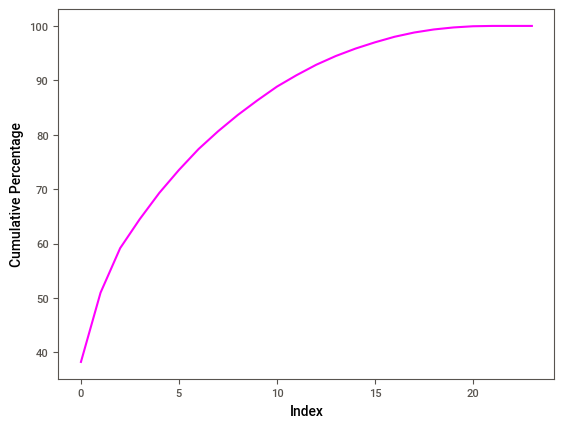

In [84]:
# Variance plot for PCA components obtained
plt.plot(var1,color='magenta')
plt.xlabel('Index')
plt.ylabel('Cumulative Percentage')
plt.show()

In [85]:
#selected first 15 columns as it contains data as shown in graph 95%
data_pca = pc_components[:,:15]

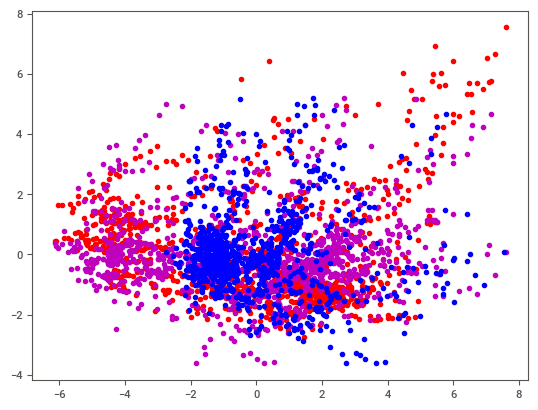

In [86]:
# Plot between PCA's
x=pc_components[:,0]
y=pc_components[:,1]
z=pc_components[:,2]
plt.scatter(x,y,c='red')
plt.scatter(x,z,c='m')
plt.scatter(y,z,c='blue')
plt.show()

In [87]:
 #Model Building
#There are various types of clustring mostly used are :
#k-means clustring
#Hierarchy clustring
#DBSCAN clustring
#K-means Clustring

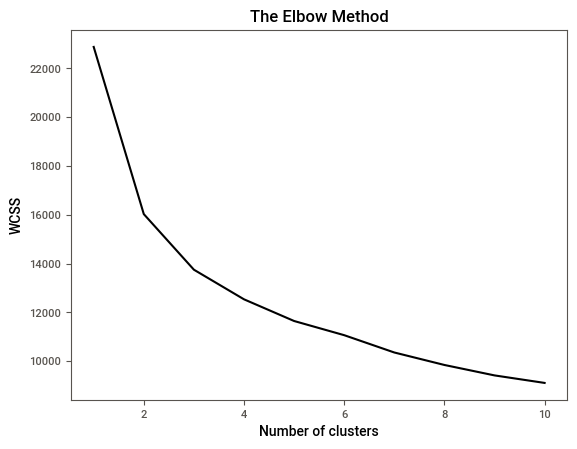

In [88]:
#Using the elbow method to find the optimal number of clusters
from sklearn.cluster import KMeans
wcss = []
for i in range(1, 11):
        kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
        kmeans.fit(data_pca)
        wcss.append(kmeans.inertia_)
plt.plot(range(1, 11), wcss,color='black')
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [89]:
# creating clusters
kmeans = KMeans(n_clusters = 5, init = 'k-means++', random_state = 42)
y_kmeans = kmeans.fit_predict(data_pca)

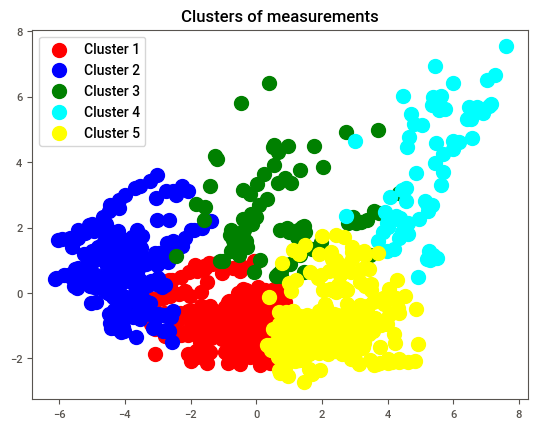

In [90]:
plt.scatter(data_pca[y_kmeans == 0, 0], data_pca[y_kmeans == 0, 1], s = 100, c= 'red', label = 'Cluster 1')
plt.scatter(data_pca[y_kmeans == 1, 0], data_pca[y_kmeans == 1, 1], s = 100, c= 'blue', label = 'Cluster 2')
plt.scatter(data_pca[y_kmeans == 2, 0], data_pca[y_kmeans == 2, 1], s = 100, c= 'green', label = 'Cluster 3')
plt.scatter(data_pca[y_kmeans == 3, 0], data_pca[y_kmeans == 3, 1], s = 100, c= 'cyan', label = 'Cluster 4')
plt.scatter(data_pca[y_kmeans == 4, 0], data_pca[y_kmeans == 4, 1], s = 100, c= 'yellow', label = 'Cluster 5')
plt.title('Clusters of measurements')
plt.legend()
plt.show()

In [91]:
# Accuracy check
from sklearn.metrics import silhouette_score
s1_kmeans = silhouette_score(data_pca, y_kmeans)
print('Silhouette Score for K-means clustring :', s1_kmeans)

Silhouette Score for K-means clustring : 0.20746633930783082


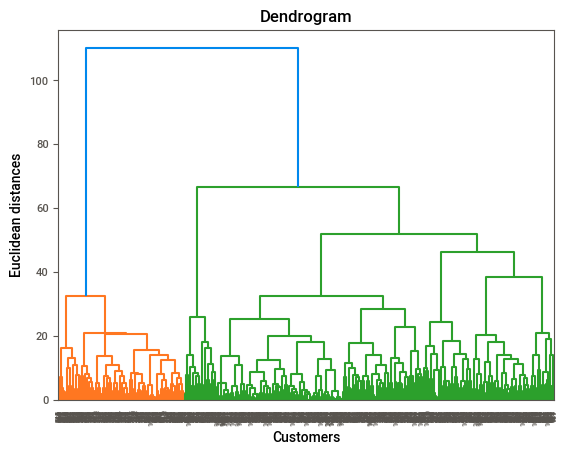

In [92]:
#Hierarchy Clustring
import scipy.cluster.hierarchy as sch
dendrogram = sch.dendrogram(sch.linkage(data_pca, method = 'ward'))
plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean distances')
plt.show()

In [93]:
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters = 5, affinity = 'euclidean', linkage ='ward')
y_hc = hc.fit_predict(data_pca)

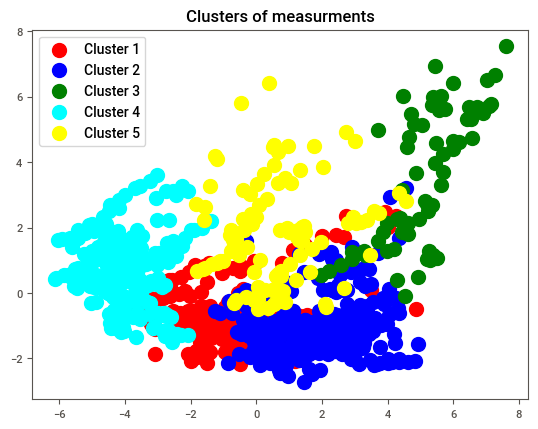

In [94]:
plt.scatter(data_pca[y_hc == 0, 0], data_pca[y_hc == 0, 1], s = 100, c = 'red',label = 'Cluster 1')
plt.scatter(data_pca[y_hc == 1, 0], data_pca[y_hc == 1, 1], s = 100, c ='blue', label = 'Cluster 2')
plt.scatter(data_pca[y_hc == 2, 0], data_pca[y_hc == 2, 1], s = 100, c ='green', label = 'Cluster 3')
plt.scatter(data_pca[y_hc == 3, 0], data_pca[y_hc == 3, 1], s = 100, c ='cyan', label = 'Cluster 4')
plt.scatter(data_pca[y_hc == 4, 0], data_pca[y_hc == 4, 1], s = 100, c ='yellow', label = 'Cluster 5')
plt.title('Clusters of measurments')
plt.legend()
plt.show()

In [95]:
# Accuracy check
s1_hierarchy = silhouette_score(data_pca,y_hc)
print('Silhouette Score for Hierarchy clustring :',s1_hierarchy)

Silhouette Score for Hierarchy clustring : 0.21490801627967665


In [96]:
#DBSCAN
from sklearn.cluster import DBSCAN
eps = 0.5
min_samples = 5
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
# Fit the data to obtain clustering labels
dbscan_labels = dbscan.fit_predict(data_pca)

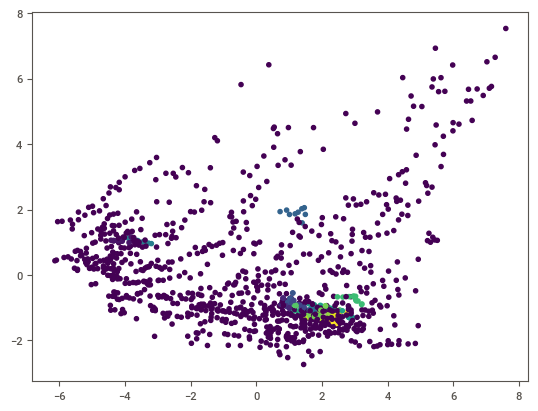

In [97]:
plt.scatter(data_pca[:, 0], data_pca[:, 1], c=dbscan_labels)
plt.show()

In [98]:
data1['cluster']=dbscan.labels_
data1.head()

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Ease_of_Business,Energy_Usage,GDP,Health_Exp_percentage_GDP,Health_Exp_per_Capita,Hours_to_do_Tax,...,Mobile_Phone_Usage,Population_0_to_14,Population_15_to_64,Population_65_plus,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound,Country_encoded,cluster
0,0.020,49.051656,87931.0,26.0,94.869565,26998.0,5.479006e+10,0.035,60.0,302.461048,...,0.0,0.342,0.619,0.039,31719449,0.599,102000000.0,193000000.0,2.0,-1
2,0.043,49.051656,1617.0,26.0,94.869565,1983.0,2.359122e+09,0.043,15.0,302.461048,...,0.0,0.454,0.517,0.029,6949366,0.383,77000000.0,50000000.0,20.0,-1
3,0.027,49.051656,4276.0,26.0,94.869565,1836.0,5.788312e+09,0.047,152.0,302.461048,...,0.1,0.383,0.587,0.029,1755375,0.532,227000000.0,209000000.0,25.0,-1
4,0.046,49.051656,1041.0,26.0,94.869565,14673.0,2.610959e+09,0.051,12.0,302.461048,...,0.0,0.468,0.505,0.028,11607944,0.178,23000000.0,30000000.0,29.0,-1
5,0.042,49.051656,301.0,26.0,94.869565,14673.0,8.704861e+08,0.063,7.0,302.461048,...,0.0,0.490,0.481,0.029,6674286,0.082,1400000.0,14000000.0,30.0,-1


In [99]:
# Use pandas filtering and get noisy datapoints -1
data1[data1['cluster']==-1]

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Ease_of_Business,Energy_Usage,GDP,Health_Exp_percentage_GDP,Health_Exp_per_Capita,Hours_to_do_Tax,...,Mobile_Phone_Usage,Population_0_to_14,Population_15_to_64,Population_65_plus,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound,Country_encoded,cluster
0,0.020,49.051656,87931.0,26.0,94.869565,26998.0,5.479006e+10,0.03500,60.000000,302.461048,...,0.0,0.342000,0.619,0.039,31719449,0.599,1.020000e+08,193000000.0,2.0,-1
2,0.043,49.051656,1617.0,26.0,94.869565,1983.0,2.359122e+09,0.04300,15.000000,302.461048,...,0.0,0.454000,0.517,0.029,6949366,0.383,7.700000e+07,50000000.0,20.0,-1
3,0.027,49.051656,4276.0,26.0,94.869565,1836.0,5.788312e+09,0.04700,152.000000,302.461048,...,0.1,0.383000,0.587,0.029,1755375,0.532,2.270000e+08,209000000.0,25.0,-1
4,0.046,49.051656,1041.0,26.0,94.869565,14673.0,2.610959e+09,0.05100,12.000000,302.461048,...,0.0,0.468000,0.505,0.028,11607944,0.178,2.300000e+07,30000000.0,29.0,-1
5,0.042,49.051656,301.0,26.0,94.869565,14673.0,8.704861e+08,0.06300,7.000000,302.461048,...,0.0,0.490000,0.481,0.029,6674286,0.082,1.400000e+06,14000000.0,30.0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2652,0.016,49.051656,8529.0,26.0,94.869565,14673.0,1.549332e+10,0.06417,214.627847,302.461048,...,0.9,0.228000,0.673,0.099,258000,0.685,6.885000e+08,456000000.0,135.0,-1
2661,0.010,49.051656,8529.0,26.0,94.869565,14673.0,1.549332e+10,0.06417,214.627847,302.461048,...,1.3,0.199000,0.690,0.110,102384,0.424,1.414000e+09,296000000.0,9.0,-1
2665,0.012,49.051656,8529.0,26.0,94.869565,14673.0,5.473536e+09,0.06417,214.627847,302.461048,...,1.4,0.303062,0.642,0.052,64798,1.000,4.610000e+08,411000000.0,21.0,-1
2669,0.013,49.051656,8529.0,26.0,94.869565,14673.0,1.549332e+10,0.06417,214.627847,302.461048,...,1.7,0.303062,0.642,0.052,57570,1.000,6.885000e+08,456000000.0,34.0,-1


In [100]:
s1_dbscan = silhouette_score(data_pca, dbscan_labels)
print("Silhouette Score for DBSCAN is:", s1_dbscan)

Silhouette Score for DBSCAN is: -0.24380431741484246


In [101]:
#Method 2
#With ouliers

In [102]:
## Standardization of data
scaler = StandardScaler()
scale_data = scaler.fit_transform(data2)

In [103]:
#Apply PCA
pc = PCA()
pc_components = pc.fit_transform(scale_data)

In [104]:
# in percentage - The amount of variance that each PCA explains is
var = pc.explained_variance_ratio_
var

array([3.52595664e-01, 1.66668623e-01, 6.12948589e-02, 5.33069518e-02,
       4.59935300e-02, 3.98740358e-02, 3.80856924e-02, 3.31573767e-02,
       3.28690286e-02, 3.23744527e-02, 2.94653611e-02, 2.47605986e-02,
       2.11842644e-02, 1.84471846e-02, 1.25144343e-02, 1.08721054e-02,
       8.89476326e-03, 5.34362958e-03, 4.34563896e-03, 3.55670903e-03,
       2.12578633e-03, 1.60464989e-03, 6.63127567e-04, 1.53314868e-06])

In [105]:
# Cumulative variance
var1 = np.cumsum(np.round(var,decimals=4)*100)
var1

array([ 35.26,  51.93,  58.06,  63.39,  67.99,  71.98,  75.79,  79.11,
        82.4 ,  85.64,  88.59,  91.07,  93.19,  95.03,  96.28,  97.37,
        98.26,  98.79,  99.22,  99.58,  99.79,  99.95, 100.02, 100.02])

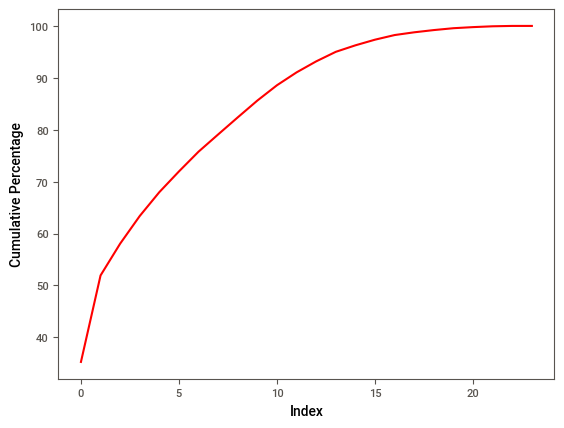

In [106]:
# Variance plot for PCA components obtained
plt.plot(var1,color='red')
plt.xlabel('Index')
plt.ylabel('Cumulative Percentage')
plt.show()

In [107]:
data_pca2 = pc_components[:,:15]

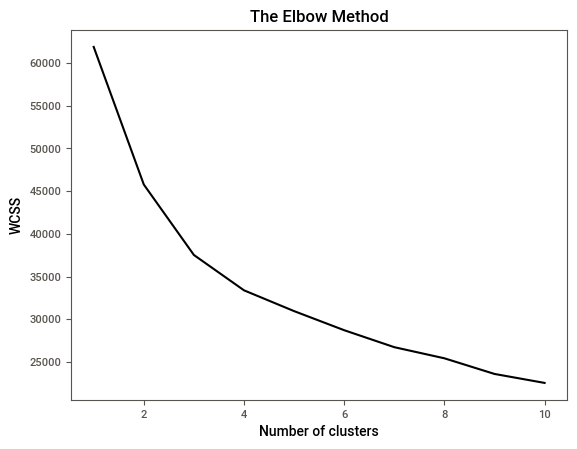

In [108]:
#K-means Clustring
#Using the elbow method to find the optimal number of clusters
wcss = []
for i in range(1, 11):
        kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
        kmeans.fit(data_pca2)
        wcss.append(kmeans.inertia_)
plt.plot(range(1, 11), wcss,color='black')
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [109]:
 # creating clusters
kmeans = KMeans(n_clusters = 5, init = 'k-means++', random_state = 42)
y_kmeans = kmeans.fit_predict(data_pca2)

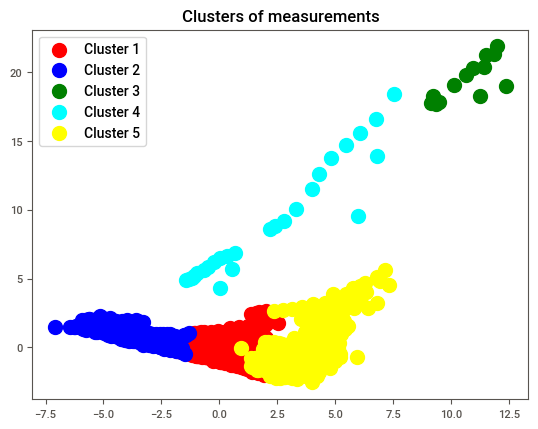

In [110]:
plt.scatter(data_pca2[y_kmeans == 0, 0], data_pca2[y_kmeans == 0, 1], s = 100,c = 'red', label = 'Cluster 1')
plt.scatter(data_pca2[y_kmeans == 1, 0], data_pca2[y_kmeans == 1, 1], s = 100,c = 'blue', label = 'Cluster 2')
plt.scatter(data_pca2[y_kmeans == 2, 0], data_pca2[y_kmeans == 2, 1], s = 100,c = 'green', label = 'Cluster 3')
plt.scatter(data_pca2[y_kmeans == 3, 0], data_pca2[y_kmeans == 3, 1], s = 100,c = 'cyan', label = 'Cluster 4')
plt.scatter(data_pca2[y_kmeans == 4, 0], data_pca2[y_kmeans == 4, 1], s = 100,c = 'yellow', label = 'Cluster 5')
plt.title('Clusters of measurements')
plt.legend()
plt.show()

In [111]:
# Accuracy Check
s2_kmeans = silhouette_score(data_pca2, y_kmeans)
print('Silhouette Score for K-means clustring :', s2_kmeans)

Silhouette Score for K-means clustring : 0.21788431475715392


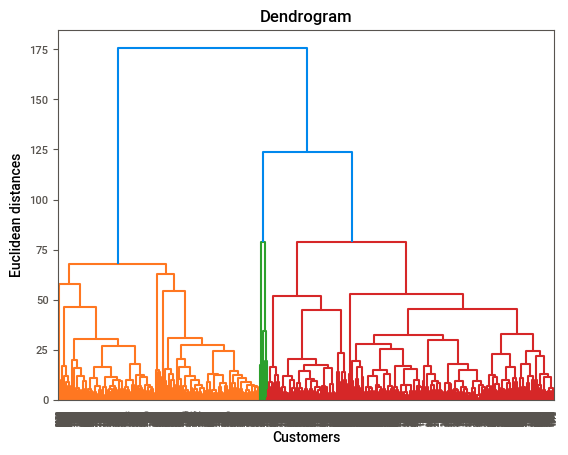

In [112]:
#Hierarchy Clustring
dendrogram = sch.dendrogram(sch.linkage(data_pca2, method = 'ward'))
plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean distances')
plt.show()

In [113]:
hc = AgglomerativeClustering(n_clusters = 5, affinity = 'euclidean', linkage ='ward')
y_hc = hc.fit_predict(data_pca2)

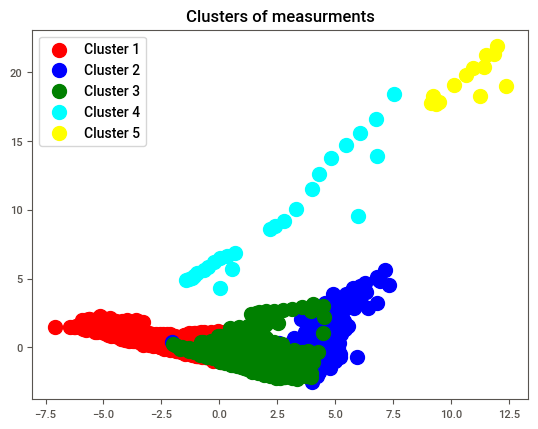

In [114]:
plt.scatter(data_pca2[y_hc == 0, 0], data_pca2[y_hc == 0, 1], s = 100, c ='red', label = 'Cluster 1')
plt.scatter(data_pca2[y_hc == 1, 0], data_pca2[y_hc == 1, 1], s = 100, c ='blue', label = 'Cluster 2')
plt.scatter(data_pca2[y_hc == 2, 0], data_pca2[y_hc == 2, 1], s = 100, c ='green', label = 'Cluster 3')
plt.scatter(data_pca2[y_hc == 3, 0], data_pca2[y_hc == 3, 1], s = 100, c ='cyan', label = 'Cluster 4')
plt.scatter(data_pca2[y_hc == 4, 0], data_pca2[y_hc == 4, 1], s = 100, c ='yellow', label = 'Cluster 5')
plt.title('Clusters of measurments')
plt.legend()
plt.show()

In [115]:
# Accuracy check
s2_hierarchy = silhouette_score(data_pca2,y_hc)
print('Silhouette Score for Hierarchy clustring :',s2_hierarchy)

Silhouette Score for Hierarchy clustring : 0.2013771515518624


In [116]:
#DBSCAN
dbscan = DBSCAN(eps=0.2,min_samples=5)
dbscan_labels = dbscan.fit_predict(data_pca2)

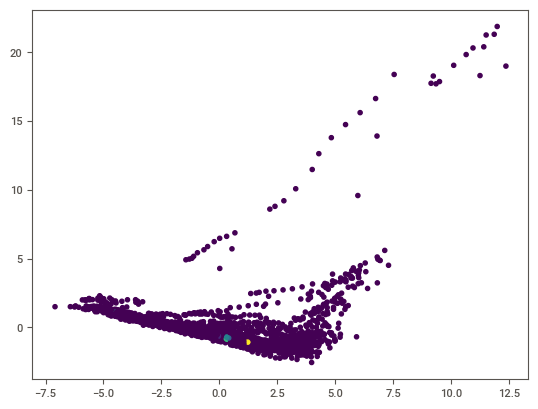

In [117]:
plt.scatter(data_pca2[:,0],data_pca2[:,1],c=dbscan_labels)
plt.show()

In [118]:
data2['cluster']=dbscan.labels_

In [119]:
data2[data2['cluster']==-1]

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Ease_of_Business,Energy_Usage,GDP,Health_Exp_percentage_GDP,Health_Exp_per_Capita,Hours_to_do_Tax,...,Mobile_Phone_Usage,Population_0_to_14,Population_15_to_64,Population_65_plus,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound,Country_encoded,cluster
0,0.020,49.051656,87931.0,26.0,94.869565,26998.0,5.479006e+10,0.03500,60.000000,302.461048,...,0.0,0.342,0.619,0.039,31719449,0.599,1.020000e+08,1.930000e+08,2.0,-1
1,0.050,49.051656,9542.0,26.0,94.869565,7499.0,9.129595e+09,0.03400,22.000000,302.461048,...,0.0,0.476,0.499,0.025,13924930,0.324,3.400000e+07,1.460000e+08,5.0,-1
2,0.043,49.051656,1617.0,26.0,94.869565,1983.0,2.359122e+09,0.04300,15.000000,302.461048,...,0.0,0.454,0.517,0.029,6949366,0.383,7.700000e+07,5.000000e+07,20.0,-1
3,0.027,49.051656,4276.0,26.0,94.869565,1836.0,5.788312e+09,0.04700,152.000000,302.461048,...,0.1,0.383,0.587,0.029,1755375,0.532,2.270000e+08,2.090000e+08,25.0,-1
4,0.046,49.051656,1041.0,26.0,94.869565,14673.0,2.610959e+09,0.05100,12.000000,302.461048,...,0.0,0.468,0.505,0.028,11607944,0.178,2.300000e+07,3.000000e+07,29.0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2698,0.015,29.100000,8529.0,41.0,63.000000,14673.0,2.343634e+10,0.05400,972.000000,210.000000,...,1.4,0.207,0.705,0.088,1337439,0.088,6.885000e+08,4.560000e+08,189.0,-1
2700,0.013,46.400000,8529.0,5.0,4.000000,2132446.0,1.624460e+13,0.17900,214.627847,175.000000,...,1.0,0.196,0.667,0.136,313873685,0.811,2.000920e+11,1.265730e+11,198.0,-1
2701,0.015,41.900000,8529.0,7.0,85.000000,14673.0,5.000435e+10,0.08900,214.627847,310.000000,...,1.5,0.220,0.639,0.140,3395253,0.948,2.222000e+09,1.028000e+09,199.0,-1
2702,0.020,61.900000,8529.0,144.0,180.000000,14673.0,3.812862e+11,0.04600,593.000000,792.000000,...,1.0,0.288,0.652,0.060,29954782,0.889,9.040000e+08,3.202000e+09,202.0,-1


In [120]:
s2_dbscan = silhouette_score(data_pca2, dbscan_labels)
print("Silhouette Score for DBSCAN is:", s2_dbscan)

Silhouette Score for DBSCAN is: -0.4347932556380283


In [121]:
data3.head()

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Ease_of_Business,Energy_Usage,GDP,Health_Exp_percentage_GDP,Health_Exp_per_Capita,Hours_to_do_Tax,...,Life_Expectancy_Male,Mobile_Phone_Usage,Population_0_to_14,Population_15_to_64,Population_65_plus,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound,Country_encoded
0,0.020,49.051656,87931.0,26.0,94.869565,26998.0,5.479006e+10,0.035,60.0,302.461048,...,67.0,0.0,0.342,0.619,0.039,31719449,0.599,102000000.0,193000000.0,2.0
1,0.050,49.051656,9542.0,26.0,94.869565,7499.0,9.129595e+09,0.034,22.0,302.461048,...,44.0,0.0,0.476,0.499,0.025,13924930,0.324,34000000.0,146000000.0,5.0
2,0.043,49.051656,1617.0,26.0,94.869565,1983.0,2.359122e+09,0.043,15.0,302.461048,...,53.0,0.0,0.454,0.517,0.029,6949366,0.383,77000000.0,50000000.0,20.0
3,0.027,49.051656,4276.0,26.0,94.869565,1836.0,5.788312e+09,0.047,152.0,302.461048,...,49.0,0.1,0.383,0.587,0.029,1755375,0.532,227000000.0,209000000.0,25.0
4,0.046,49.051656,1041.0,26.0,94.869565,14673.0,2.610959e+09,0.051,12.0,302.461048,...,49.0,0.0,0.468,0.505,0.028,11607944,0.178,23000000.0,30000000.0,29.0


In [122]:
data3.shape

(2678, 24)

In [123]:
#Method 3

In [124]:
# Normalization function # use sklearn library norm
def norm_func(i):
    x = (i-i.min())/(i.max()-i.min())
    return x

In [125]:
# Normalized data frame (considering the numerical part of data)
df_norm = norm_func(data3)

In [126]:
df_norm

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Ease_of_Business,Energy_Usage,GDP,Health_Exp_percentage_GDP,Health_Exp_per_Capita,Hours_to_do_Tax,...,Life_Expectancy_Male,Mobile_Phone_Usage,Population_0_to_14,Population_15_to_64,Population_65_plus,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound,Country_encoded
0,0.282609,0.123456,0.010610,0.036075,0.499306,0.009895,0.003369,0.124424,0.058233,0.112234,...,0.588235,0.000000,0.586387,0.377604,0.149378,0.023470,0.563181,0.000506,0.001523,0.009662
1,0.934783,0.123456,0.001151,0.036075,0.499306,0.002746,0.000558,0.119816,0.020080,0.112234,...,0.137255,0.000000,0.937173,0.065104,0.091286,0.010296,0.263617,0.000166,0.001152,0.024155
2,0.782609,0.123456,0.000194,0.036075,0.499306,0.000724,0.000141,0.161290,0.013052,0.112234,...,0.313725,0.000000,0.879581,0.111979,0.107884,0.005131,0.327887,0.000381,0.000393,0.096618
3,0.434783,0.123456,0.000515,0.036075,0.499306,0.000670,0.000352,0.179724,0.150602,0.112234,...,0.235294,0.034483,0.693717,0.294271,0.107884,0.001286,0.490196,0.001131,0.001650,0.120773
4,0.847826,0.123456,0.000125,0.036075,0.499306,0.005376,0.000157,0.198157,0.010040,0.112234,...,0.235294,0.000000,0.916230,0.080729,0.103734,0.008580,0.104575,0.000111,0.000235,0.140097
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2699,0.282609,0.123456,0.001028,0.036075,0.499306,0.005376,0.000950,0.258846,0.213482,0.112234,...,0.627451,0.172414,0.484457,0.437500,0.203320,0.000010,0.903050,0.003437,0.003601,0.932367
2700,0.130435,0.115443,0.001028,0.005772,0.015957,0.781766,1.000000,0.788018,0.213482,0.062983,...,0.764706,0.344828,0.204188,0.502604,0.551867,0.232369,0.794118,1.000000,1.000000,0.956522
2701,0.173913,0.101843,0.001028,0.008658,0.446809,0.005376,0.003074,0.373272,0.213482,0.115147,...,0.725490,0.517241,0.267016,0.429688,0.568465,0.002500,0.943355,0.011101,0.008120,0.961353
2702,0.282609,0.162285,0.001028,0.206349,0.952128,0.005376,0.023468,0.175115,0.593373,0.301391,...,0.686275,0.344828,0.445026,0.463542,0.236515,0.022164,0.879085,0.004514,0.025296,0.975845


In [127]:
#Apply PCA
from sklearn.decomposition import PCA
pc = PCA()
pc_components = pc.fit_transform(df_norm)

In [128]:
# The amount of variance that each PCA explains is
pc.explained_variance_

array([3.72557954e-01, 8.58466095e-02, 3.93882307e-02, 3.85094095e-02,
       3.34866533e-02, 2.49604782e-02, 2.07714099e-02, 1.60328873e-02,
       8.66603156e-03, 7.54547184e-03, 7.31897540e-03, 5.91182920e-03,
       5.23315775e-03, 4.90601536e-03, 4.04721873e-03, 3.96258832e-03,
       2.64095928e-03, 1.92190802e-03, 7.81436327e-04, 7.40902300e-04,
       6.43169617e-04, 4.40979830e-04, 2.08400089e-04, 1.82472409e-06])

In [129]:
 # in percentage - The amount of variance that each PCA explains is
var = pc.explained_variance_ratio_
var 

array([5.42672481e-01, 1.25045223e-01, 5.73733795e-02, 5.60932777e-02,
       4.87770694e-02, 3.63577384e-02, 3.02558901e-02, 2.33537001e-02,
       1.26230478e-02, 1.09908267e-02, 1.06609092e-02, 8.61124284e-03,
       7.62268170e-03, 7.14616209e-03, 5.89522839e-03, 5.77195470e-03,
       3.84685365e-03, 2.79947477e-03, 1.13824973e-03, 1.07920737e-03,
       9.36848744e-04, 6.42336624e-04, 3.03558123e-04, 2.65791546e-06])

In [130]:
# Cumulative variance
var1 = np.cumsum(np.round(var,decimals=4)*100)
var1

array([ 54.27,  66.77,  72.51,  78.12,  83.  ,  86.64,  89.67,  92.01,
        93.27,  94.37,  95.44,  96.3 ,  97.06,  97.77,  98.36,  98.94,
        99.32,  99.6 ,  99.71,  99.82,  99.91,  99.97, 100.  , 100.  ])

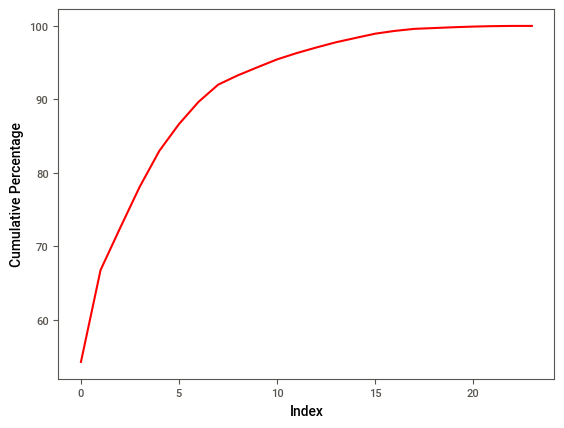

In [131]:
# Variance plot for PCA components obtained
plt.plot(var1,color='red')
plt.xlabel('Index')
plt.ylabel('Cumulative Percentage')
plt.show()

In [132]:
data_norm = pc_components[:,:15]

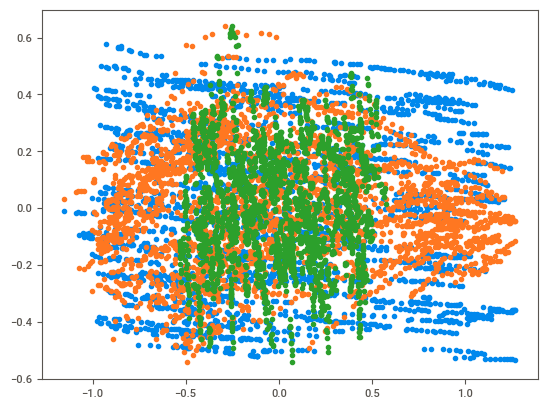

In [133]:
## Plot between PCA's
x=pc_components[:,0]
y=pc_components[:,1]
z=pc_components[:,2]
plt.scatter(x,y)
plt.scatter(x,z)
plt.scatter(y,z)
plt.show()

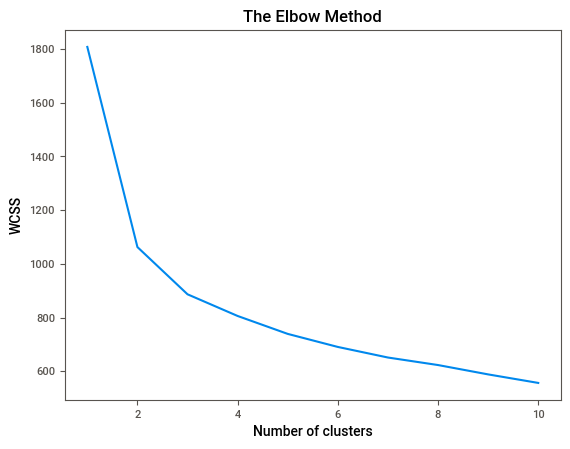

In [134]:
##K-means Clustring
#Using the elbow method to find the optimal number of clusters
from sklearn.cluster import KMeans
wcss = []
for i in range(1, 11):
        kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
        kmeans.fit(data_norm)
        wcss.append(kmeans.inertia_)
plt.plot(range(1, 11), wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [135]:
# creating clusters
kmeans = KMeans(n_clusters = 5, init = 'k-means++', random_state = 42)
y_kmeans = kmeans.fit_predict(data_norm)

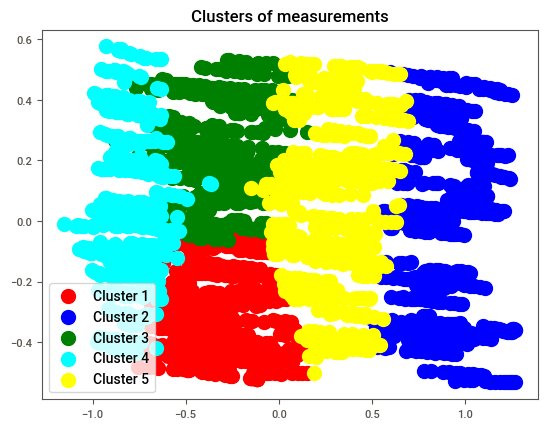

In [136]:
plt.scatter(data_norm[y_kmeans == 0, 0], data_norm[y_kmeans == 0, 1], s = 100,c = 'red', label = 'Cluster 1')
plt.scatter(data_norm[y_kmeans == 1, 0], data_norm[y_kmeans == 1, 1], s = 100,c = 'blue', label = 'Cluster 2')
plt.scatter(data_norm[y_kmeans == 2, 0], data_norm[y_kmeans == 2, 1], s = 100,c = 'green', label = 'Cluster 3')
plt.scatter(data_norm[y_kmeans == 3, 0], data_norm[y_kmeans == 3, 1], s = 100,c = 'cyan', label = 'Cluster 4')
plt.scatter(data_norm[y_kmeans == 4, 0], data_norm[y_kmeans == 4, 1], s = 100,c = 'yellow', label = 'Cluster 5')
plt.title('Clusters of measurements')
plt.legend()
plt.show()

In [137]:
# Accuracy check
from sklearn.metrics import silhouette_score
s3_kmeans = silhouette_score(data_norm, y_kmeans)
print('Silhouette Score for K-means clustring :', s3_kmeans)

Silhouette Score for K-means clustring : 0.1950651604387396


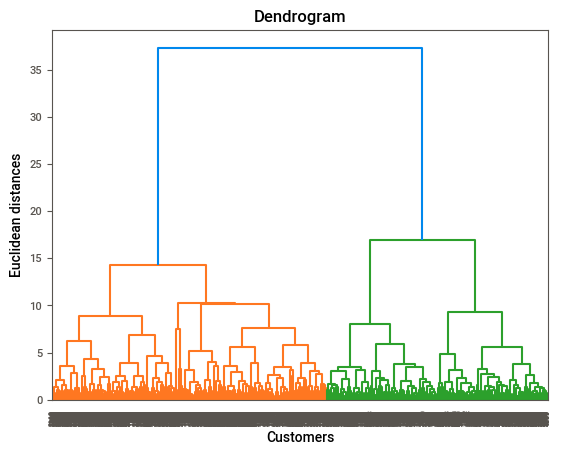

In [138]:
#Hierarchy Clustring
import scipy.cluster.hierarchy as sch
dendrogram = sch.dendrogram(sch.linkage(data_norm, method = 'ward'))
plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean distances')
plt.show()

In [139]:
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters = 5, affinity = 'euclidean', linkage ='ward')
y_hc = hc.fit_predict(data_norm)

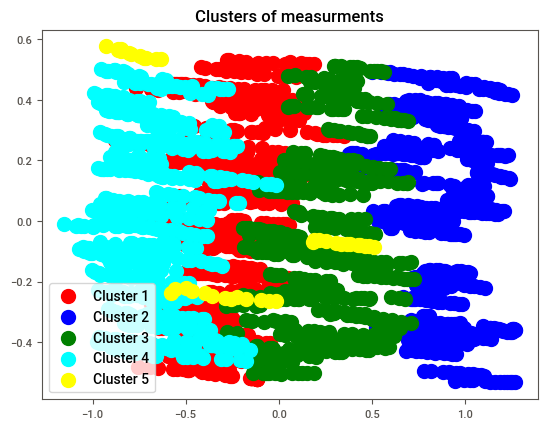

In [140]:
plt.scatter(data_norm[y_hc == 0, 0], data_norm[y_hc == 0, 1], s = 100, c ='red', label = 'Cluster 1')
plt.scatter(data_norm[y_hc == 1, 0], data_norm[y_hc == 1, 1], s = 100, c ='blue', label = 'Cluster 2')
plt.scatter(data_norm[y_hc == 2, 0], data_norm[y_hc == 2, 1], s = 100, c ='green', label = 'Cluster 3')
plt.scatter(data_norm[y_hc == 3, 0], data_norm[y_hc == 3, 1], s = 100, c ='cyan', label = 'Cluster 4')
plt.scatter(data_norm[y_hc == 4, 0], data_norm[y_hc == 4, 1], s = 100, c ='yellow', label = 'Cluster 5')
plt.title('Clusters of measurments')
plt.legend()
plt.show()

In [141]:
# Accuracy check
s3_hierarchy = silhouette_score(data_norm,y_hc)
print('Silhouette Score for Hierarchy clustring :',s3_hierarchy)

Silhouette Score for Hierarchy clustring : 0.1666710258324616


In [142]:
#DBSCAN
from sklearn.cluster import DBSCAN
eps = 0.5
min_samples = 5
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
# Fit the data to obtain clustering labels
dbscan_labels = dbscan.fit_predict(data_norm)

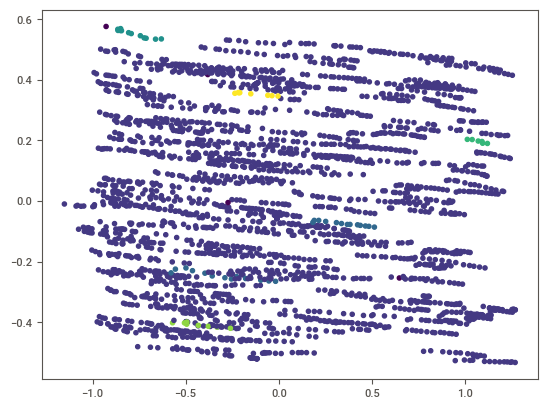

In [143]:
plt.scatter(data_norm[:, 0], data_norm[:, 1], c=dbscan_labels)
plt.show()

In [144]:
data3['cluster']=dbscan.labels_
data3.head()

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Ease_of_Business,Energy_Usage,GDP,Health_Exp_percentage_GDP,Health_Exp_per_Capita,Hours_to_do_Tax,...,Mobile_Phone_Usage,Population_0_to_14,Population_15_to_64,Population_65_plus,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound,Country_encoded,cluster
0,0.020,49.051656,87931.0,26.0,94.869565,26998.0,5.479006e+10,0.035,60.0,302.461048,...,0.0,0.342,0.619,0.039,31719449,0.599,102000000.0,193000000.0,2.0,0
1,0.050,49.051656,9542.0,26.0,94.869565,7499.0,9.129595e+09,0.034,22.0,302.461048,...,0.0,0.476,0.499,0.025,13924930,0.324,34000000.0,146000000.0,5.0,0
2,0.043,49.051656,1617.0,26.0,94.869565,1983.0,2.359122e+09,0.043,15.0,302.461048,...,0.0,0.454,0.517,0.029,6949366,0.383,77000000.0,50000000.0,20.0,0
3,0.027,49.051656,4276.0,26.0,94.869565,1836.0,5.788312e+09,0.047,152.0,302.461048,...,0.1,0.383,0.587,0.029,1755375,0.532,227000000.0,209000000.0,25.0,0
4,0.046,49.051656,1041.0,26.0,94.869565,14673.0,2.610959e+09,0.051,12.0,302.461048,...,0.0,0.468,0.505,0.028,11607944,0.178,23000000.0,30000000.0,29.0,0


In [145]:
# Use pandas filtering and get noisy datapoints -1
data3[data3['cluster']==-1]

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Ease_of_Business,Energy_Usage,GDP,Health_Exp_percentage_GDP,Health_Exp_per_Capita,Hours_to_do_Tax,...,Mobile_Phone_Usage,Population_0_to_14,Population_15_to_64,Population_65_plus,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound,Country_encoded,cluster
1173,0.009,57.3,333869.0,34.0,94.869565,142883.0,8.614202e+10,0.064,117.000000,2085.0,...,0.6,0.147,0.695,0.158,47105150,0.678,3.542000e+09,3.078000e+09,195.0,-1
1887,0.037,44.1,4620.0,135.0,94.869565,14673.0,9.380413e+09,0.056,861.000000,492.0,...,0.3,0.395,0.575,0.030,676851,0.391,6.885000e+08,4.560000e+08,57.0,-1
2522,0.021,31.6,8529.0,35.0,188.000000,14673.0,8.187366e+10,0.039,578.000000,889.0,...,1.6,0.295,0.658,0.047,6154623,0.780,6.885000e+08,2.654000e+09,108.0,-1
2700,0.013,46.4,8529.0,5.0,4.000000,2132446.0,1.624460e+13,0.179,214.627847,175.0,...,1.0,0.196,0.667,0.136,313873685,0.811,2.000920e+11,1.265730e+11,198.0,-1


In [146]:
s3_dbscan = silhouette_score(data_norm, dbscan_labels)
print("Silhouette Score for DBSCAN is:", s3_dbscan)

Silhouette Score for DBSCAN is: 0.003439661153308624


In [147]:
#Method 4

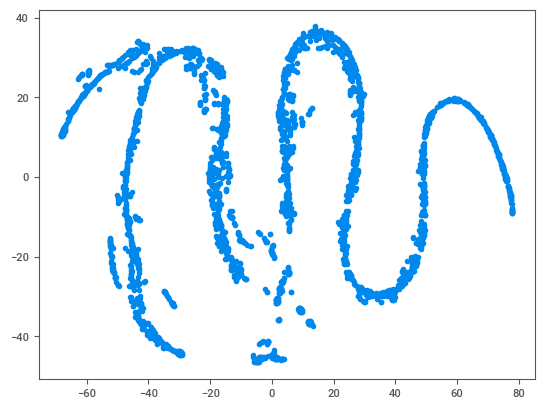

In [148]:
#T-SNE
from sklearn.manifold import TSNE
# Initialize t-SNE with default parameters
tsne = TSNE()
# Fit and transform the data to 2 dimensions
data_tsne = tsne.fit_transform(data4)
# Plot the results
plt.scatter(data_tsne[:, 0], data_tsne[:, 1])
plt.show()

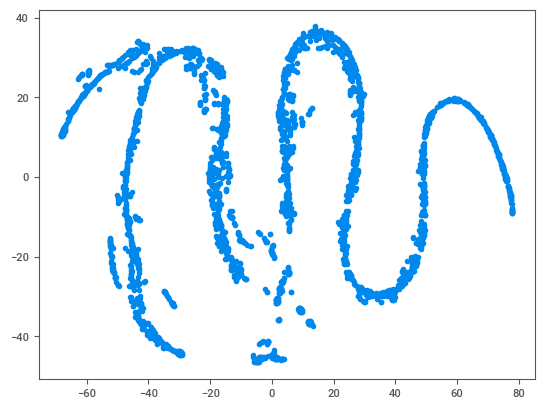

In [149]:
#K-means Clustring
# Perform clustering with KMeans
kmeans = KMeans(n_clusters = 5, init = 'k-means++', random_state = 42)
y_kmeans = kmeans.fit_predict(data_tsne)
# Plot the clusters
plt.scatter(data_tsne[:, 0], data_tsne[:, 1])
plt.show()

In [150]:
# Accuracy check
s4_kmeans = silhouette_score(data_tsne, y_kmeans)
print('Silhouette Score for K-means clustring :', s4_kmeans)

Silhouette Score for K-means clustring : 0.4402031


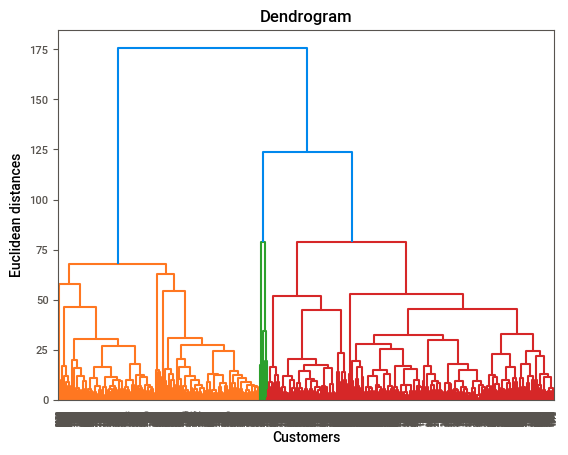

In [151]:
#Hierarchy Clustring
dendrogram = sch.dendrogram(sch.linkage(data_pca2, method = 'ward'))
plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean distances')
plt.show()

In [152]:
hc = AgglomerativeClustering(n_clusters = 5, affinity = 'euclidean', linkage ='ward')
y_hc = hc.fit_predict(data_tsne)

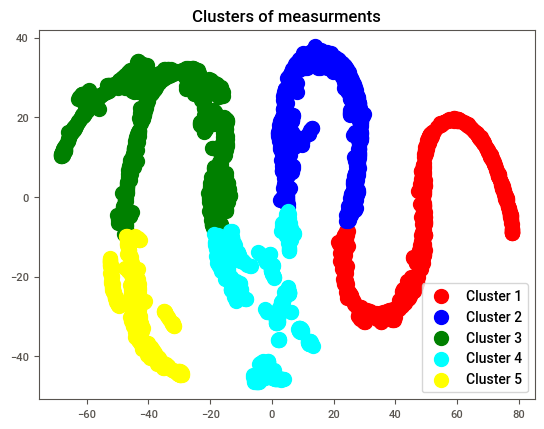

In [153]:
plt.scatter(data_tsne[y_hc == 0, 0], data_tsne[y_hc == 0, 1], s = 100, c ='red', label = 'Cluster 1')
plt.scatter(data_tsne[y_hc == 1, 0], data_tsne[y_hc == 1, 1], s = 100, c ='blue', label = 'Cluster 2')
plt.scatter(data_tsne[y_hc == 2, 0], data_tsne[y_hc == 2, 1], s = 100, c ='green', label = 'Cluster 3')
plt.scatter(data_tsne[y_hc == 3, 0], data_tsne[y_hc == 3, 1], s = 100, c ='cyan', label = 'Cluster 4')
plt.scatter(data_tsne[y_hc == 4, 0], data_tsne[y_hc == 4, 1], s = 100, c ='yellow', label = 'Cluster 5')
plt.title('Clusters of measurments')
plt.legend()
plt.show()

In [154]:
# Accuracy check
s4_hierarchy = silhouette_score(data_tsne,y_hc)
print('Silhouette Score for Hierarchy clustring :',s4_hierarchy)

Silhouette Score for Hierarchy clustring : 0.42244497


In [155]:
#Method 5 Robust Scaler

In [156]:
from sklearn.preprocessing import RobustScaler

In [157]:
scaler = RobustScaler()
scale_data = scaler.fit_transform(data5)

In [158]:
#Apply PCA
from sklearn.decomposition import PCA
pc = PCA()
pc_components = pc.fit_transform(scale_data)

In [159]:
#The amount of variance that each PCA explains is
pc.explained_variance_

array([5.23118268e+02, 2.07777967e+02, 7.38475450e+01, 2.06295057e+01,
       1.46918426e+01, 1.19441333e+01, 9.84372753e+00, 6.95540709e+00,
       6.46254937e+00, 5.87444785e+00, 4.17019694e+00, 2.75066706e+00,
       8.46320304e-01, 6.69033916e-01, 3.31475065e-01, 2.93191217e-01,
       2.38965502e-01, 1.79021813e-01, 1.16976739e-01, 8.70089339e-02,
       4.75898329e-02, 2.14094344e-02, 9.10594615e-03, 1.22625466e-05])

In [160]:
#in percentage - The amount of variance that each PCA explains is
var = pc.explained_variance_ratio_
var

array([5.87175361e-01, 2.33220880e-01, 8.28903548e-02, 2.31556384e-02,
       1.64908941e-02, 1.34067212e-02, 1.10491157e-02, 7.80711344e-03,
       7.25390411e-03, 6.59378814e-03, 4.68084761e-03, 3.08749287e-03,
       9.49954264e-04, 7.50958731e-04, 3.72064986e-04, 3.29093187e-04,
       2.68227404e-04, 2.00943466e-04, 1.31300823e-04, 9.76633874e-05,
       5.34173226e-05, 2.40310712e-05, 1.02209912e-05, 1.37641249e-08])

In [161]:
# Cumulative variance
var1 = np.cumsum(np.round(var,decimals=4)*100)
var1

array([ 58.72,  82.04,  90.33,  92.65,  94.3 ,  95.64,  96.74,  97.52,
        98.25,  98.91,  99.38,  99.69,  99.78,  99.86,  99.9 ,  99.93,
        99.96,  99.98,  99.99, 100.  , 100.01, 100.01, 100.01, 100.01])

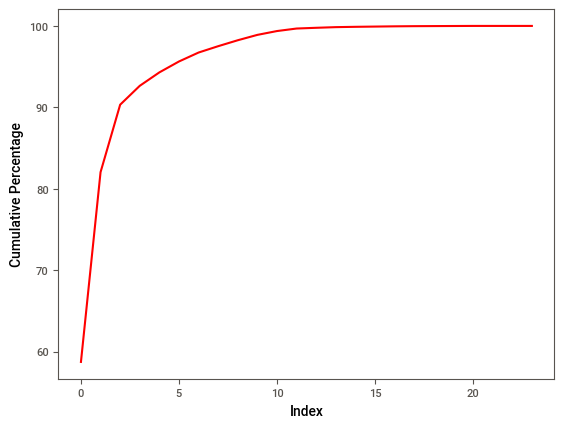

In [162]:
# Variance plot for PCA components obtained
plt.plot(var1,color='red')
plt.xlabel('Index')
plt.ylabel('Cumulative Percentage')
plt.show()

In [163]:
data_pca = pc_components[:,:15]

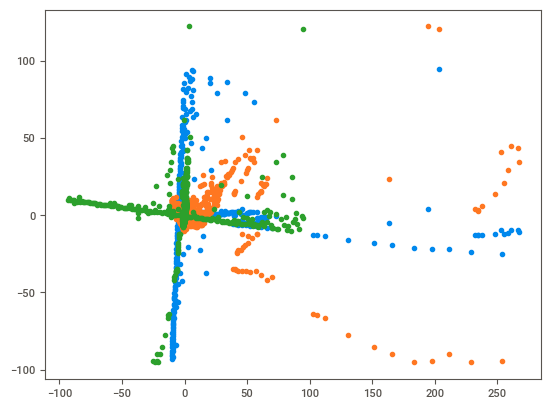

In [164]:
## Plot between PCA's
x=pc_components[:,0]
y=pc_components[:,1]
z=pc_components[:,2]
plt.scatter(x,y)
plt.scatter(x,z)
plt.scatter(y,z)
plt.show()

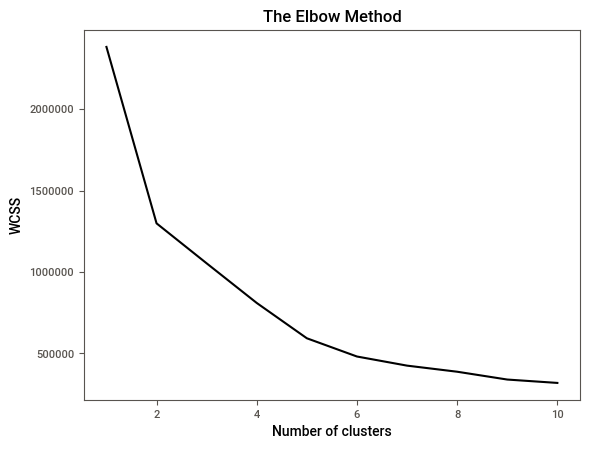

In [165]:
#K-means Clustring
#Using the elbow method to find the optimal number of clusters
wcss = []
for i in range(1, 11):
        kmeans = KMeans(n_clusters = i, init = 'k-means++', random_state = 42)
        kmeans.fit(data_pca)
        wcss.append(kmeans.inertia_)
plt.plot(range(1, 11), wcss,color='black')
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [166]:
# creating clusters
kmeans = KMeans(n_clusters = 5, init = 'k-means++', random_state = 42)
y_kmeans = kmeans.fit_predict(data_pca)

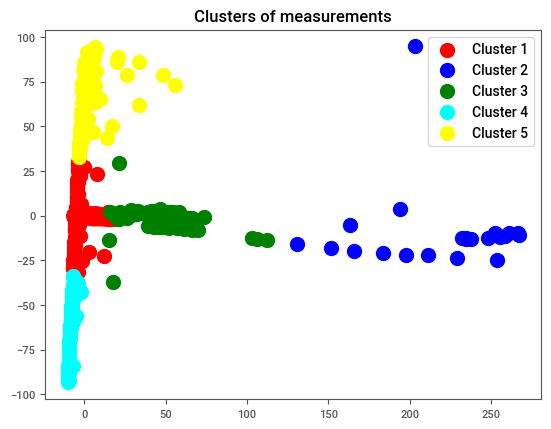

In [167]:
plt.scatter(data_pca[y_kmeans == 0, 0], data_pca[y_kmeans == 0, 1], s = 100, c= 'red', label = 'Cluster 1')
plt.scatter(data_pca[y_kmeans == 1, 0], data_pca[y_kmeans == 1, 1], s = 100, c= 'blue', label = 'Cluster 2')
plt.scatter(data_pca[y_kmeans == 2, 0], data_pca[y_kmeans == 2, 1], s = 100, c= 'green', label = 'Cluster 3')
plt.scatter(data_pca[y_kmeans == 3, 0], data_pca[y_kmeans == 3, 1], s = 100, c= 'cyan', label = 'Cluster 4')
plt.scatter(data_pca[y_kmeans == 4, 0], data_pca[y_kmeans == 4, 1], s = 100, c= 'yellow', label = 'Cluster 5')
plt.title('Clusters of measurements')
plt.legend()
plt.show()

In [168]:
## Accuracy check
from sklearn.metrics import silhouette_score
s5_kmeans = silhouette_score(data_pca, y_kmeans)
print('Silhouette Score for K-means clustring :', s5_kmeans)

Silhouette Score for K-means clustring : 0.7830875750152193


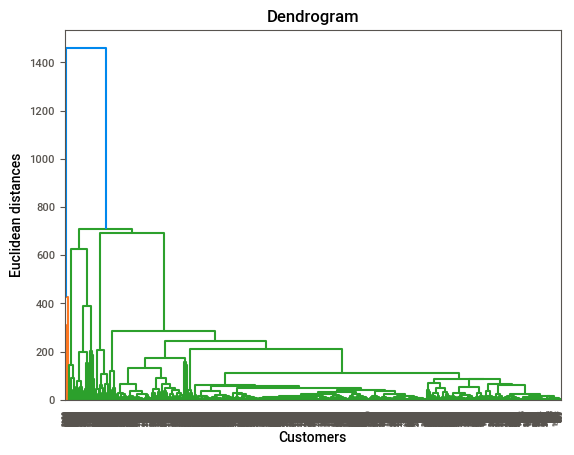

In [169]:
#Hierarchy Clustring
import scipy.cluster.hierarchy as sch
dendrogram = sch.dendrogram(sch.linkage(data_pca, method = 'ward'))
plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean distances')
plt.show()

In [170]:
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters = 5, affinity = 'euclidean', linkage ='ward')
y_hc = hc.fit_predict(data_pca)

In [171]:
y_hc

array([2, 2, 2, ..., 2, 3, 2], dtype=int64)

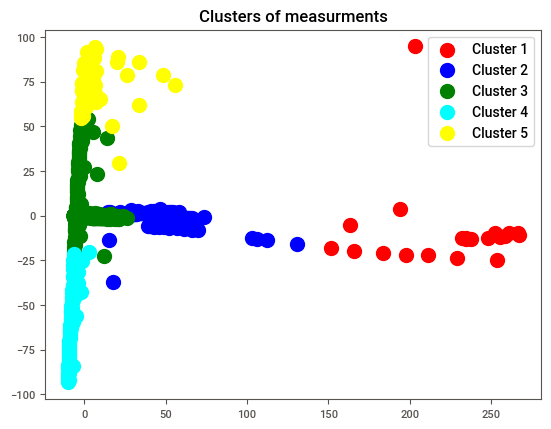

In [172]:
plt.scatter(data_pca[y_hc == 0, 0], data_pca[y_hc == 0, 1], s = 100, c = 'red',label = 'Cluster 1')
plt.scatter(data_pca[y_hc == 1, 0], data_pca[y_hc == 1, 1], s = 100, c ='blue', label = 'Cluster 2')
plt.scatter(data_pca[y_hc == 2, 0], data_pca[y_hc == 2, 1], s = 100, c ='green', label = 'Cluster 3')
plt.scatter(data_pca[y_hc == 3, 0], data_pca[y_hc == 3, 1], s = 100, c ='cyan', label = 'Cluster 4')
plt.scatter(data_pca[y_hc == 4, 0], data_pca[y_hc == 4, 1], s = 100, c ='yellow', label = 'Cluster 5')
plt.title('Clusters of measurments')
plt.legend()
plt.show()

In [173]:
# Accuracy check
s5_hierarchy = silhouette_score(data_pca,y_hc)
print('Silhouette Score for Hierarchy clustring :',s5_hierarchy)

Silhouette Score for Hierarchy clustring : 0.7798188166395211


In [174]:
#DBSCAN
from sklearn.cluster import DBSCAN
eps = 0.4
min_samples = 8
dbscan = DBSCAN(eps=eps, min_samples=min_samples)
# Fit the data to obtain clustering labels
dbscan_labels = dbscan.fit_predict(data_pca)

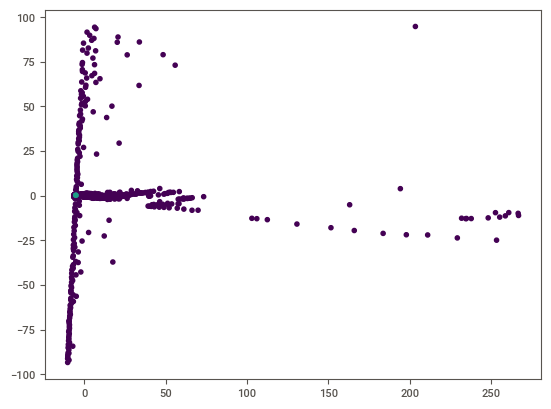

In [175]:
plt.scatter(data_pca[:, 0], data_pca[:, 1], c=dbscan_labels)
plt.show()

In [176]:
data5['cluster']=dbscan.labels_
data5.head()

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Ease_of_Business,Energy_Usage,GDP,Health_Exp_percentage_GDP,Health_Exp_per_Capita,Hours_to_do_Tax,...,Mobile_Phone_Usage,Population_0_to_14,Population_15_to_64,Population_65_plus,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound,Country_encoded,cluster
0,0.020,49.051656,87931.0,26.0,94.869565,26998.0,5.479006e+10,0.035,60.0,302.461048,...,0.0,0.342,0.619,0.039,31719449,0.599,102000000.0,193000000.0,2.0,-1
1,0.050,49.051656,9542.0,26.0,94.869565,7499.0,9.129595e+09,0.034,22.0,302.461048,...,0.0,0.476,0.499,0.025,13924930,0.324,34000000.0,146000000.0,5.0,-1
2,0.043,49.051656,1617.0,26.0,94.869565,1983.0,2.359122e+09,0.043,15.0,302.461048,...,0.0,0.454,0.517,0.029,6949366,0.383,77000000.0,50000000.0,20.0,-1
3,0.027,49.051656,4276.0,26.0,94.869565,1836.0,5.788312e+09,0.047,152.0,302.461048,...,0.1,0.383,0.587,0.029,1755375,0.532,227000000.0,209000000.0,25.0,-1
4,0.046,49.051656,1041.0,26.0,94.869565,14673.0,2.610959e+09,0.051,12.0,302.461048,...,0.0,0.468,0.505,0.028,11607944,0.178,23000000.0,30000000.0,29.0,-1


In [177]:
# Use pandas filtering and get noisy datapoints -1
data5[data5['cluster']==-1]

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Ease_of_Business,Energy_Usage,GDP,Health_Exp_percentage_GDP,Health_Exp_per_Capita,Hours_to_do_Tax,...,Mobile_Phone_Usage,Population_0_to_14,Population_15_to_64,Population_65_plus,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound,Country_encoded,cluster
0,0.020,49.051656,87931.0,26.0,94.869565,26998.0,5.479006e+10,0.035,60.000000,302.461048,...,0.0,0.342,0.619,0.039,31719449,0.599,1.020000e+08,1.930000e+08,2.0,-1
1,0.050,49.051656,9542.0,26.0,94.869565,7499.0,9.129595e+09,0.034,22.000000,302.461048,...,0.0,0.476,0.499,0.025,13924930,0.324,3.400000e+07,1.460000e+08,5.0,-1
2,0.043,49.051656,1617.0,26.0,94.869565,1983.0,2.359122e+09,0.043,15.000000,302.461048,...,0.0,0.454,0.517,0.029,6949366,0.383,7.700000e+07,5.000000e+07,20.0,-1
3,0.027,49.051656,4276.0,26.0,94.869565,1836.0,5.788312e+09,0.047,152.000000,302.461048,...,0.1,0.383,0.587,0.029,1755375,0.532,2.270000e+08,2.090000e+08,25.0,-1
4,0.046,49.051656,1041.0,26.0,94.869565,14673.0,2.610959e+09,0.051,12.000000,302.461048,...,0.0,0.468,0.505,0.028,11607944,0.178,2.300000e+07,3.000000e+07,29.0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2697,0.018,27.900000,8529.0,694.0,165.000000,14673.0,5.012121e+09,0.059,521.000000,199.000000,...,1.1,0.278,0.656,0.066,534541,0.662,7.900000e+07,5.800000e+07,178.0,-1
2698,0.015,29.100000,8529.0,41.0,63.000000,14673.0,2.343634e+10,0.054,972.000000,210.000000,...,1.4,0.207,0.705,0.088,1337439,0.088,6.885000e+08,4.560000e+08,189.0,-1
2700,0.013,46.400000,8529.0,5.0,4.000000,2132446.0,1.624460e+13,0.179,214.627847,175.000000,...,1.0,0.196,0.667,0.136,313873685,0.811,2.000920e+11,1.265730e+11,198.0,-1
2701,0.015,41.900000,8529.0,7.0,85.000000,14673.0,5.000435e+10,0.089,214.627847,310.000000,...,1.5,0.220,0.639,0.140,3395253,0.948,2.222000e+09,1.028000e+09,199.0,-1


In [178]:
s5_dbscan = silhouette_score(data_pca, dbscan_labels)
print("Silhouette Score for DBSCAN is:", s5_dbscan)

Silhouette Score for DBSCAN is: -0.5195227911197519


In [179]:
df = pd.DataFrame({'Method':['M1 kmeans','M1 hierarchy','M1 DBSCAN','M2␣kmeans','M2 hierarchy','M2 DBSCAN','M3 kmeans','M3 hierarchy','M2␣DBSCAN','M4 kmeans','M4 hierarchy','M5 kmeans','M5 hierarchy','M5 DBSCAN'],
'Silhouette Score':[s1_kmeans,s1_hierarchy,s1_dbscan,s2_kmeans,s2_hierarchy,s2_dbscan,s3_kmeans,s3_hierarchy,s3_dbscan,s4_kmeans,s4_hierarchy,s5_kmeans,s5_hierarchy,s5_dbscan]})
df

,Method,Silhouette Score
0,M1 kmeans,0.207466
1,M1 hierarchy,0.214908
2,M1 DBSCAN,-0.243804
3,M2␣kmeans,0.217884
4,M2 hierarchy,0.201377
5,M2 DBSCAN,-0.434793
6,M3 kmeans,0.195065
7,M3 hierarchy,0.166671
8,M2␣DBSCAN,0.003440
9,M4 kmeans,0.440203


In [180]:
#robust scaler gave better silhoutte score of 0.77 so taking its clusters as lebells column and adding it in original data(data5)………..
#after adding labells as extra columns making that column as y or target column and remaining 15 columns as x or feature set

In [181]:
#Model Building

In [182]:
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

In [183]:
data5['labells']=y_hc

In [184]:
data5['labells'].unique()

array([2, 1, 0, 3, 4], dtype=int64)

In [301]:
data5.head()

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Ease_of_Business,Energy_Usage,GDP,Health_Exp_percentage_GDP,Health_Exp_per_Capita,Hours_to_do_Tax,...,Population_0_to_14,Population_15_to_64,Population_65_plus,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound,Country_encoded,cluster,labells
0,0.020,49.051656,87931.0,26.0,94.869565,26998.0,5.479006e+10,0.035,60.0,302.461048,...,0.342,0.619,0.039,31719449,0.599,102000000.0,193000000.0,2.0,-1,2
1,0.050,49.051656,9542.0,26.0,94.869565,7499.0,9.129595e+09,0.034,22.0,302.461048,...,0.476,0.499,0.025,13924930,0.324,34000000.0,146000000.0,5.0,-1,2
2,0.043,49.051656,1617.0,26.0,94.869565,1983.0,2.359122e+09,0.043,15.0,302.461048,...,0.454,0.517,0.029,6949366,0.383,77000000.0,50000000.0,20.0,-1,2
3,0.027,49.051656,4276.0,26.0,94.869565,1836.0,5.788312e+09,0.047,152.0,302.461048,...,0.383,0.587,0.029,1755375,0.532,227000000.0,209000000.0,25.0,-1,2
4,0.046,49.051656,1041.0,26.0,94.869565,14673.0,2.610959e+09,0.051,12.0,302.461048,...,0.468,0.505,0.028,11607944,0.178,23000000.0,30000000.0,29.0,-1,2


In [302]:
data5.tail()

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Ease_of_Business,Energy_Usage,GDP,Health_Exp_percentage_GDP,Health_Exp_per_Capita,Hours_to_do_Tax,...,Population_0_to_14,Population_15_to_64,Population_65_plus,Population_Total,Population_Urban,Tourism_Inbound,Tourism_Outbound,Country_encoded,cluster,labells
2699,0.020,49.051656,8529.0,26.0,94.869565,14673.0,1.549332e+10,0.06417,214.627847,302.461048,...,0.303062,0.642,0.052,32427,0.911,6.885000e+08,4.560000e+08,193.0,1,2
2700,0.013,46.400000,8529.0,5.0,4.000000,2132446.0,1.624460e+13,0.17900,214.627847,175.000000,...,0.196000,0.667,0.136,313873685,0.811,2.000920e+11,1.265730e+11,198.0,-1,0
2701,0.015,41.900000,8529.0,7.0,85.000000,14673.0,5.000435e+10,0.08900,214.627847,310.000000,...,0.220000,0.639,0.140,3395253,0.948,2.222000e+09,1.028000e+09,199.0,-1,2
2702,0.020,61.900000,8529.0,144.0,180.000000,14673.0,3.812862e+11,0.04600,593.000000,792.000000,...,0.288000,0.652,0.060,29954782,0.889,9.040000e+08,3.202000e+09,202.0,-1,3
2703,0.011,49.051656,8529.0,26.0,94.869565,14673.0,1.549332e+10,0.06417,214.627847,302.461048,...,0.206000,0.641,0.152,105275,0.949,6.885000e+08,4.560000e+08,204.0,3,2


In [186]:
X=data5.iloc[:,:15]

In [304]:
X.head()

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Ease_of_Business,Energy_Usage,GDP,Health_Exp_percentage_GDP,Health_Exp_per_Capita,Hours_to_do_Tax,Infant_Mortality_Rate,Internet_Usage,Lending_Interest,Life_Expectancy_Female,Life_Expectancy_Male
0,0.020,49.051656,87931.0,26.0,94.869565,26998.0,5.479006e+10,0.035,60.0,302.461048,0.034,0.0,0.100,71.0,67.0
1,0.050,49.051656,9542.0,26.0,94.869565,7499.0,9.129595e+09,0.034,22.0,302.461048,0.128,0.0,1.032,47.0,44.0
2,0.043,49.051656,1617.0,26.0,94.869565,1983.0,2.359122e+09,0.043,15.0,302.461048,0.090,0.0,0.119,57.0,53.0
3,0.027,49.051656,4276.0,26.0,94.869565,1836.0,5.788312e+09,0.047,152.0,302.461048,0.054,0.0,0.155,52.0,49.0
4,0.046,49.051656,1041.0,26.0,94.869565,14673.0,2.610959e+09,0.051,12.0,302.461048,0.096,0.0,0.119,52.0,49.0


In [303]:
X.tail()

,Birth_Rate,Business_Tax_Rate,CO2_Emissions,Days_to_Start_Business,Ease_of_Business,Energy_Usage,GDP,Health_Exp_percentage_GDP,Health_Exp_per_Capita,Hours_to_do_Tax,Infant_Mortality_Rate,Internet_Usage,Lending_Interest,Life_Expectancy_Female,Life_Expectancy_Male
2699,0.020,49.051656,8529.0,26.0,94.869565,14673.0,1.549332e+10,0.06417,214.627847,302.461048,0.020,0.1,0.119,75.0,69.0
2700,0.013,46.400000,8529.0,5.0,4.000000,2132446.0,1.624460e+13,0.17900,214.627847,175.000000,0.006,0.8,0.033,81.0,76.0
2701,0.015,41.900000,8529.0,7.0,85.000000,14673.0,5.000435e+10,0.08900,214.627847,310.000000,0.010,0.5,0.112,80.0,74.0
2702,0.020,61.900000,8529.0,144.0,180.000000,14673.0,3.812862e+11,0.04600,593.000000,792.000000,0.013,0.5,0.164,78.0,72.0
2703,0.011,49.051656,8529.0,26.0,94.869565,14673.0,1.549332e+10,0.06417,214.627847,302.461048,0.020,0.4,0.119,83.0,76.0


In [188]:
y=data5['labells']

In [305]:
y

0       2
1       2
2       2
3       2
4       2
       ..
2699    2
2700    0
2701    2
2702    3
2703    2
Name: labells, Length: 2678, dtype: int64

In [243]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=0)

In [244]:
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((2142, 15), (536, 15), (2142,), (536,))

In [245]:
X_test.dtypes

Birth_Rate                   float64
Business_Tax_Rate            float64
CO2_Emissions                float64
Days_to_Start_Business       float64
Ease_of_Business             float64
Energy_Usage                 float64
GDP                          float64
Health_Exp_percentage_GDP    float64
Health_Exp_per_Capita        float64
Hours_to_do_Tax              float64
Infant_Mortality_Rate        float64
Internet_Usage               float64
Lending_Interest             float64
Life_Expectancy_Female       float64
Life_Expectancy_Male         float64
dtype: object

In [246]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score,recall_score
import sklearn.metrics as metrics

In [247]:
#Decision Tree Classifier

In [248]:
from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier

model_decision_tree = DecisionTreeClassifier(criterion ='entropy',min_samples_split=5,max_leaf_nodes=15,random_state=0)
model_decision_tree.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_leaf_nodes=15,
                       min_samples_split=5, random_state=0)

In [249]:
y_pred=model_decision_tree.predict(X_test)

In [250]:
print("training_accuracy =", model_decision_tree.score(X_train,y_train))

training_accuracy = 0.9990662931839402


In [251]:
from sklearn.metrics import accuracy_score
print("test_accuracy = ",accuracy_score(y_test,y_pred))

test_accuracy =  0.9981343283582089


In [252]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         3
           1       1.00      1.00      1.00        15
           2       1.00      1.00      1.00       495
           3       1.00      1.00      1.00        14
           4       0.90      1.00      0.95         9

    accuracy                           1.00       536
   macro avg       0.98      1.00      0.99       536
weighted avg       1.00      1.00      1.00       536



In [253]:
recall_decision_tree=recall_score(y_test,y_pred,average=None)

In [254]:
from sklearn.metrics import confusion_matrix
cm=confusion_matrix(y_test,y_pred)
cm

array([[  3,   0,   0,   0,   0],
       [  0,  15,   0,   0,   0],
       [  0,   0, 494,   0,   1],
       [  0,   0,   0,  14,   0],
       [  0,   0,   0,   0,   9]], dtype=int64)

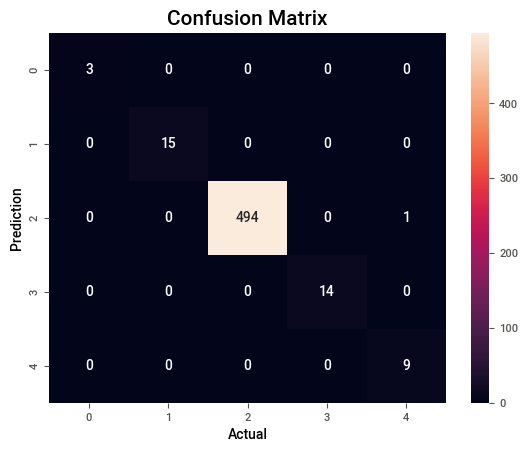

In [255]:
sns.heatmap(cm,
            annot=True,
            fmt='g')
plt.ylabel('Prediction',fontsize=10)
plt.xlabel('Actual',fontsize=10)
plt.title('Confusion Matrix',fontsize=15)
plt.show()

In [256]:
##ExtraTreeClassifier

In [257]:
ET=ExtraTreeClassifier()
ET.fit(X_train,y_train)

ExtraTreeClassifier()

In [258]:
y_pred=ET.predict(X_test)

In [259]:
print("train_accuracy_ET=" ,ET.score(X_train,y_train))

train_accuracy_ET= 1.0


In [260]:
print("test_accuracy_ET=" ,accuracy_score(y_test,y_pred))

test_accuracy_ET= 0.9738805970149254


In [261]:
cm=confusion_matrix(y_test,y_pred)
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         3
           1       0.88      0.93      0.90        15
           2       0.99      0.99      0.99       495
           3       0.92      0.86      0.89        14
           4       0.44      0.44      0.44         9

    accuracy                           0.97       536
   macro avg       0.85      0.84      0.84       536
weighted avg       0.97      0.97      0.97       536



In [262]:
cm=confusion_matrix(y_test,y_pred)
cm

array([[  3,   0,   0,   0,   0],
       [  0,  14,   1,   0,   0],
       [  0,   0, 489,   1,   5],
       [  0,   0,   2,  12,   0],
       [  0,   2,   3,   0,   4]], dtype=int64)

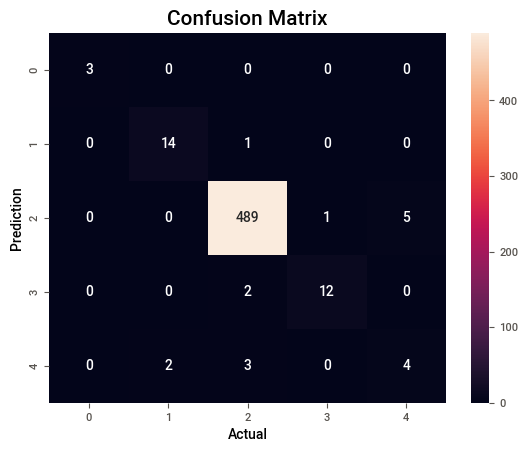

In [263]:
sns.heatmap(cm,
           annot=True,
           fmt='g')
plt.ylabel('Prediction',fontsize=10)
plt.xlabel('Actual',fontsize=10)
plt.title('Confusion Matrix',fontsize=15)
plt.show()

In [264]:
#Random Forest Classifier

In [265]:
from sklearn.ensemble import RandomForestClassifier
model_random_forest=RandomForestClassifier(criterion='gini',min_samples_split=5,random_state=0)
model_random_forest.fit(X_train,y_train)

RandomForestClassifier(min_samples_split=5, random_state=0)

In [266]:
y_pred=model_random_forest.predict(X_test)

In [267]:
print("train_accuracy = ",model_random_forest.score(X_train,y_train))

train_accuracy =  1.0


In [268]:
print("test_accuracy = ", accuracy_score(y_test,y_pred))

test_accuracy =  0.996268656716418


In [269]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         3
           1       0.94      1.00      0.97        15
           2       1.00      1.00      1.00       495
           3       1.00      1.00      1.00        14
           4       1.00      0.78      0.88         9

    accuracy                           1.00       536
   macro avg       0.99      0.96      0.97       536
weighted avg       1.00      1.00      1.00       536



In [270]:
model_random_forest.feature_importances_,model_random_forest.estimator_

(array([0.01094684, 0.0188134 , 0.11636295, 0.02431792, 0.34667278,
        0.15108966, 0.20455223, 0.02362946, 0.00819689, 0.01910608,
        0.01324733, 0.00841717, 0.01814226, 0.02242182, 0.01408322]),
 DecisionTreeClassifier())

In [271]:
cm=confusion_matrix(y_test,y_pred)
cm

array([[  3,   0,   0,   0,   0],
       [  0,  15,   0,   0,   0],
       [  0,   0, 495,   0,   0],
       [  0,   0,   0,  14,   0],
       [  0,   1,   1,   0,   7]], dtype=int64)

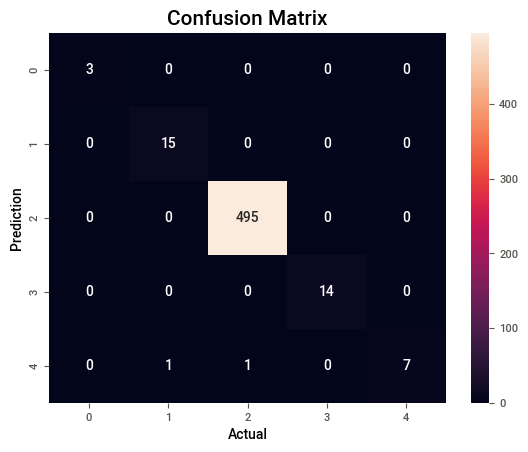

In [272]:
sns.heatmap(cm,
            annot=True,
            fmt='g')
plt.ylabel('Prediction',fontsize=10)
plt.xlabel('Actual',fontsize=10)
plt.title('Confusion Matrix',fontsize=15)
plt.show()

In [273]:
#KNN

In [274]:
#KNN
from sklearn.neighbors import KNeighborsClassifier
model_knn=KNeighborsClassifier(n_neighbors=5)
model_knn.fit(X_train,y_train)

KNeighborsClassifier()

In [275]:
y_pred=model_knn.predict(X_test)

In [276]:
print("train_accuracy = ",model_knn.score(X_train,y_train))

train_accuracy =  0.9444444444444444


In [277]:
print("test_accuracy = ", accuracy_score(y_test,y_pred))

test_accuracy =  0.9514925373134329


In [278]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.75      1.00      0.86         3
           1       0.81      0.87      0.84        15
           2       0.96      1.00      0.98       495
           3       0.00      0.00      0.00        14
           4       0.00      0.00      0.00         9

    accuracy                           0.95       536
   macro avg       0.50      0.57      0.53       536
weighted avg       0.91      0.95      0.93       536



In [279]:
cm=confusion_matrix(y_test,y_pred)
cm

array([[  3,   0,   0,   0,   0],
       [  1,  13,   1,   0,   0],
       [  0,   1, 494,   0,   0],
       [  0,   0,  14,   0,   0],
       [  0,   2,   7,   0,   0]], dtype=int64)

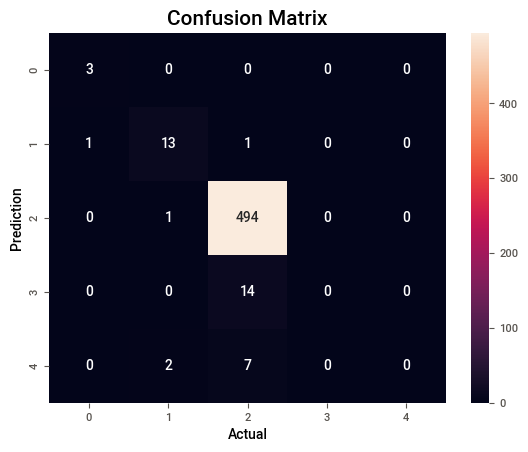

In [280]:
sns.heatmap(cm,
            annot=True,
            fmt='g')
plt.ylabel('Prediction',fontsize=10)
plt.xlabel('Actual',fontsize=10)
plt.title('Confusion Matrix',fontsize=15)
plt.show()

In [281]:
#Adaboost Classifier
from sklearn.ensemble import AdaBoostClassifier

In [282]:
model_ada=AdaBoostClassifier(n_estimators=50,random_state=0)

In [283]:
model_ada.fit(X_train,y_train)

AdaBoostClassifier(random_state=0)

In [284]:
y_pred=model_ada.predict(X_test)

In [285]:
print("training_accuracy =", model_ada.score(X_train,y_train))

training_accuracy = 0.9612511671335201


In [286]:
print("test_accuracy = ", accuracy_score(y_test,y_pred))

test_accuracy =  0.9645522388059702


In [287]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         3
           1       0.88      0.93      0.90        15
           2       0.97      0.99      0.98       495
           3       0.00      0.00      0.00        14
           4       0.80      0.89      0.84         9

    accuracy                           0.96       536
   macro avg       0.73      0.76      0.75       536
weighted avg       0.94      0.96      0.95       536



In [288]:
cm=confusion_matrix(y_test,y_pred)
cm

array([[  3,   0,   0,   0,   0],
       [  0,  14,   1,   0,   0],
       [  0,   1, 492,   0,   2],
       [  0,   0,  14,   0,   0],
       [  0,   1,   0,   0,   8]], dtype=int64)

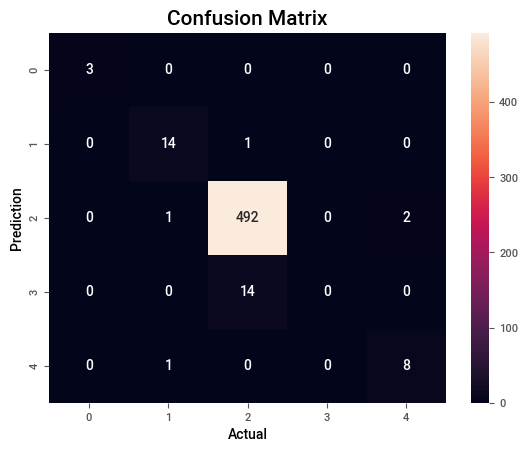

In [289]:
sns.heatmap(cm,
            annot=True,
            fmt='g')
plt.ylabel('Prediction',fontsize=10)
plt.xlabel('Actual',fontsize=10)
plt.title('Confusion Matrix',fontsize=15)
plt.show()

In [290]:
model_titles=[["DECISION TREE CLASSIFIER",0.999,0.998],["EXTRA TREE CLASSIFIER",1.0,0.973],["RANDOM FOREST CLASSIFIER",1.0,0.996],["KNN",0.944,0.951],["ADABOOST CLASSIFIER",0.961,0.964]]

In [291]:
Clustering=pd.DataFrame(model_titles,columns=["MODEL","TRAIN","TEST"])
Clustering

,MODEL,TRAIN,TEST
0,DECISION TREE CLASSIFIER,0.999,0.998
1,EXTRA TREE CLASSIFIER,1.000,0.973
2,RANDOM FOREST CLASSIFIER,1.000,0.996
3,KNN,0.944,0.951
4,ADABOOST CLASSIFIER,0.961,0.964


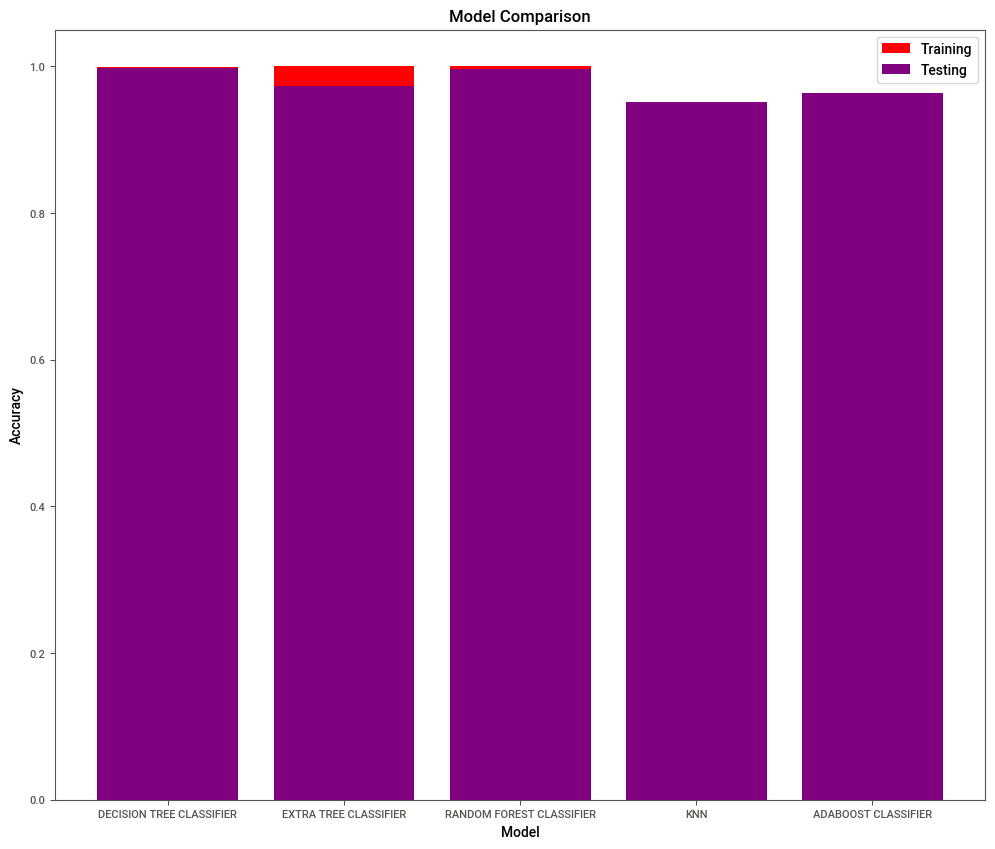

In [292]:
plt.figure(figsize=(12,10))
plt.bar(Clustering["MODEL"],Clustering["TRAIN"],label="Training",color="red")
plt.bar(Clustering["MODEL"],Clustering["TEST"],label="Testing",color="purple")
plt.xlabel("Model")
plt.ylabel("Accuracy")
plt.title("Model Comparison")
plt.legend()
plt.show()

In [ ]:
# Saving Random Forest Classifier for future prediction

In [293]:
import pickle

In [294]:
pickle.dump(model_random_forest,open("model_random_forest.pkl","wb"))